# AV Behavior with friction implementation in rainy weather

In [1]:
import os
import pandas as pd
pd.set_option('display.max_colwidth', None)
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats
from scipy.stats import norm, binom, poisson
from dtaidistance import dtw
import json

## Testing Parameters

In [2]:
weather_param = [[20,0,0,5,0,0,0,10,0],
        [20,20,20,5,0,20,5,20,0],
        [40,40,40,5,0,40,10,30,0],
        [60,60,60,5,0,60,15,40,0],
        [80,80,80,5,0,80,20,50,0],
        [100,100,100,5,0,100,30,70,0]] 

def calc_fric(weather_list):
    return np.exp(-0.916*weather_list[5]/100) * (1-weather_list[5]/100)**3 * 0.6 + 0.4 - 0.1*weather_list[2]/100

for i in range(len(weather_param)):
    friction_ratio = calc_fric(weather_param[i])
    weather_param[i] += [friction_ratio]

df = pd.DataFrame(weather_param, columns =["cloudiness","precipitation","precipitation_deposits","sun_altitude_angle","sun_azimuth_angle","wetness","fog_density","wind_intensity", "ice_thickness", "friction_ratio"],
) 
# df.index.name = 'Scenarios'
df

,cloudiness,precipitation,precipitation_deposits,sun_altitude_angle,sun_azimuth_angle,wetness,fog_density,wind_intensity,ice_thickness,friction_ratio
0,20,0,0,5,0,0,0,10,0,1.000000
1,20,20,20,5,0,20,5,20,0,0.635775
2,40,40,40,5,0,40,10,30,0,0.449842
3,60,60,60,5,0,60,15,40,0,0.362164
4,80,80,80,5,0,80,20,50,0,0.322307
5,100,100,100,5,0,100,30,70,0,0.300000


### With reduced friction

In [3]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [4]:
rel_path = "./Data/Front Accident/Rainy Reduced Friction Exponential"
os.path.isdir(rel_path)

True

In [5]:
subfolders = os.listdir(path=rel_path)
subfolders

['route_highway_epoch24_clear-sunset_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-100_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-20_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-40_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-60_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-80_fi_front_accidient']

In [6]:
head = subfolders.pop(1)
subfolders.append(head)
subfolders

['route_highway_epoch24_clear-sunset_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-20_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-40_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-60_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-80_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-100_fi_front_accidient']

In [7]:
txt_lists_fric = [[] for i in range(6)]

for i in range(len(txt_lists_fric)):
    for root, dirs, files in os.walk(os.path.join(rel_path, subfolders[i])):
        for file in files:
            if file.endswith(".txt"):
                 with open(os.path.join(root, file), encoding = 'utf-8') as f:
                    read_string = f.read()
                    json_object = json.loads(read_string)
                    txt_lists_fric[i].append(json_object)

In [8]:
txt_lists_fric[2][50]
# txt_lists_fric[0]

{'_checkpoint': {'global_record': {},
  'progress': [0, 1],
  'records': [{'index': 0,
    'infractions': {'collisions_layout': [],
     'collisions_pedestrian': [],
     'collisions_vehicle': ['Agent collided against object with type=vehicle.audi.a2 and id=228243 at (x=193.158, y=0.588, z=-0.021)'],
     'outside_route_lanes': [],
     'red_light': [],
     'route_dev': [],
     'route_timeout': [],
     'stop_infraction': [],
     'vehicle_blocked': []},
    'meta': {'duration_game': 16.825000250712037,
     'duration_system': 35.62507605552673,
     'route_length': 131.56012567009267},
    'route_id': 'RouteScenario_0',
    'scores': {'score_composed': 39.56987272961395,
     'score_penalty': 0.6,
     'score_route': 65.94978788268992},
    'status': 'Failed'}]},
 'eligible': False,
 'entry_status': 'Started',
 'labels': [],
 'sensors': ['carla_camera',
  'carla_camera',
  'carla_camera',
  'carla_imu',
  'carla_gnss',
  'carla_speedometer'],
 'values': []}

In [9]:
avg_complete_fric = [_] * 6

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        if txt['_checkpoint']['records'][0]['status'] == 'Completed':
            count += 1
    avg_complete_fric[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average complete ratio':avg_complete_fric}) 
# df.index.name = 'Scenarios'

df

,Scenarios,Average complete ratio
0,route_highway_epoch24_clear-sunset_fi_front_accidient,1.00
1,route_highway_epoch24_rain-sunset-20_fi_front_accidient,0.41
2,route_highway_epoch24_rain-sunset-40_fi_front_accidient,0.00
3,route_highway_epoch24_rain-sunset-60_fi_front_accidient,1.00
4,route_highway_epoch24_rain-sunset-80_fi_front_accidient,1.00
5,route_highway_epoch24_rain-sunset-100_fi_front_accidient,0.34


In [10]:
count = 0

avg_score_fric = [_] * 6

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        count += txt['_checkpoint']['records'][0]['scores']['score_route'] 
    avg_score_fric[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average score route':avg_score_fric}) 
df

,Scenarios,Average score route
0,route_highway_epoch24_clear-sunset_fi_front_accidient,100.000000
1,route_highway_epoch24_rain-sunset-20_fi_front_accidient,76.100762
2,route_highway_epoch24_rain-sunset-40_fi_front_accidient,66.109933
3,route_highway_epoch24_rain-sunset-60_fi_front_accidient,100.000000
4,route_highway_epoch24_rain-sunset-80_fi_front_accidient,100.000000
5,route_highway_epoch24_rain-sunset-100_fi_front_accidient,87.546582


#### Setting up into list of DataFrames

In [11]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [12]:
df_array_fric = np.empty((6,100), dtype=object)

for i in range(len(df_array_fric)):
    for j in range((len(df_array_fric[i]))):
        df_array_fric[i][j] = pd.DataFrame()

In [13]:
for i in range(len(txt_lists_fric)):
    dir_path = os.path.join(rel_path, subfolders[i])
    print(dir_path)
    # list to store files
    res = []

    # Iterate directory
    run_index = 0
    for path in os.listdir(dir_path):
        # check if current path is a file
        if not os.path.isfile(os.path.join(dir_path, path)):
            df = pd.DataFrame()
            for file in os.listdir(os.path.join(dir_path, path)):
                file_path = os.path.join(dir_path, os.path.join(path, file))
    #             print("file_path", file_path)
                if "_ctl.csv" in file_path:
                    df = pd.read_csv(file_path)
                elif "_cvip.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)
                elif "_traj.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)

            df_array_fric[i][run_index] = df
            run_index += 1

./Data/Front Accident/Rainy Reduced Friction Exponential\route_highway_epoch24_clear-sunset_fi_front_accidient
./Data/Front Accident/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-20_fi_front_accidient
./Data/Front Accident/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-40_fi_front_accidient
./Data/Front Accident/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-60_fi_front_accidient
./Data/Front Accident/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-80_fi_front_accidient
./Data/Front Accident/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-100_fi_front_accidient


In [14]:
df_array_fric[4][99]

,ts,agent_id,throttle,steer,brake,ts,agent_id,cvip,cvip_x,cvip_y,cvip_z,ts,agent_id,x,y,z,v
0,9241563,0,0.900000,-0.003288,0.0,9241563,0,501.097173,198.767441,-59.832653,-499.823944,9241563,0,192.362411,-86.262680,0.534733,0.000000
1,9241564,0,0.900000,-0.004556,0.0,9241564,0,13.812594,195.567444,-72.832657,0.100000,9241564,0,192.362411,-86.262680,0.487313,0.000000
2,9241565,0,0.900000,-0.000979,0.0,9241565,0,13.811309,195.567444,-72.832657,0.095407,9241565,0,192.362411,-86.262680,0.433781,0.000000
3,9241566,0,0.900000,-0.004389,0.0,9241566,0,13.810197,195.567444,-72.832657,0.084691,9241566,0,192.362411,-86.262680,0.374139,0.000000
4,9241567,0,0.900000,-0.005626,0.0,9241567,0,13.809258,195.567444,-72.832657,0.067854,9241567,0,192.362411,-86.262680,0.308388,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
731,9242294,0,0.424858,-0.005222,0.0,9242294,0,50.521077,192.484863,93.642967,-0.035898,9242294,0,193.194763,43.126881,-0.021071,8.911880
732,9242295,0,0.484668,-0.005037,0.0,9242295,0,50.615074,192.478226,93.959480,-0.035899,9242295,0,193.190369,43.349419,-0.021062,8.901059
733,9242296,0,0.305920,-0.004719,0.0,9242296,0,50.708023,192.471619,94.274696,-0.035901,9242296,0,193.186050,43.571709,-0.021054,8.891327
734,9242297,0,0.428555,-0.004027,0.0,9242297,0,50.799871,192.465012,94.588600,-0.035904,9242297,0,193.181854,43.793789,-0.021048,8.883027


In [15]:
df_array_fric[0][0]['x']

0      192.362411
1      192.362411
2      192.362411
3      192.362411
4      192.362411
          ...    
947    193.161560
948    193.158295
949    193.155304
950    193.152557
951    193.150070
Name: x, Length: 952, dtype: float64

### Without friction reduction

In [16]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [17]:
rel_path = "./Data/Front Accident/Rainy Original/"
os.path.isdir(rel_path)

True

In [18]:
subfolders = os.listdir(path=rel_path)
subfolders

['route_highway_epoch24_clear-sunset_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-100_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-20_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-40_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-60_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-80_fi_front_accidient']

In [19]:
head = subfolders.pop(1)
subfolders.append(head)
subfolders

['route_highway_epoch24_clear-sunset_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-20_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-40_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-60_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-80_fi_front_accidient',
 'route_highway_epoch24_rain-sunset-100_fi_front_accidient']

In [20]:
txt_lists_fric = [[] for i in range(6)]

for i in range(len(txt_lists_fric)):
    for root, dirs, files in os.walk(os.path.join(rel_path, subfolders[i])):
        for file in files:
            if file.endswith(".txt"):
                 with open(os.path.join(root, file), encoding = 'utf-8') as f:
                    read_string = f.read()
                    json_object = json.loads(read_string)
                    txt_lists_fric[i].append(json_object)

In [21]:
txt_lists_fric[2][50]
# txt_lists_fric[0]

{'_checkpoint': {'global_record': {},
  'progress': [0, 1],
  'records': [{'index': 0,
    'infractions': {'collisions_layout': [],
     'collisions_pedestrian': [],
     'collisions_vehicle': [],
     'outside_route_lanes': [],
     'red_light': [],
     'route_dev': [],
     'route_timeout': [],
     'stop_infraction': [],
     'vehicle_blocked': []},
    'meta': {'duration_game': 24.050000358372927,
     'duration_system': 47.069212198257446,
     'route_length': 131.56012567009267},
    'route_id': 'RouteScenario_0',
    'scores': {'score_composed': 100.0,
     'score_penalty': 1.0,
     'score_route': 100.0},
    'status': 'Completed'}]},
 'eligible': False,
 'entry_status': 'Started',
 'labels': [],
 'sensors': ['carla_camera',
  'carla_camera',
  'carla_camera',
  'carla_imu',
  'carla_gnss',
  'carla_speedometer'],
 'values': []}

In [22]:
avg_complete_orig = [_] * 6

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        if txt['_checkpoint']['records'][0]['status'] == 'Completed':
            count += 1
    avg_complete_orig[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average complete ratio':avg_complete_orig}) 
# df.index.name = 'Scenarios'

df

,Scenarios,Average complete ratio
0,route_highway_epoch24_clear-sunset_fi_front_accidient,1.00
1,route_highway_epoch24_rain-sunset-20_fi_front_accidient,1.00
2,route_highway_epoch24_rain-sunset-40_fi_front_accidient,1.00
3,route_highway_epoch24_rain-sunset-60_fi_front_accidient,1.00
4,route_highway_epoch24_rain-sunset-80_fi_front_accidient,1.00
5,route_highway_epoch24_rain-sunset-100_fi_front_accidient,0.06


In [23]:
count = 0

avg_score_orig = [_] * 6

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        count += txt['_checkpoint']['records'][0]['scores']['score_route'] 
    avg_score_orig[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average score route':avg_score_orig}) 
df

,Scenarios,Average score route
0,route_highway_epoch24_clear-sunset_fi_front_accidient,100.000000
1,route_highway_epoch24_rain-sunset-20_fi_front_accidient,100.000000
2,route_highway_epoch24_rain-sunset-40_fi_front_accidient,100.000000
3,route_highway_epoch24_rain-sunset-60_fi_front_accidient,100.000000
4,route_highway_epoch24_rain-sunset-80_fi_front_accidient,100.000000
5,route_highway_epoch24_rain-sunset-100_fi_front_accidient,58.904848


#### Setting up into list of DataFrames

In [24]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [25]:
df_array_orig = np.empty((6,100), dtype=object)

for i in range(len(df_array_orig)):
    for j in range((len(df_array_orig[i]))):
        df_array_orig[i][j] = pd.DataFrame()

In [26]:
rel_path = "./Data/Front Accident/Rainy Original/"

In [27]:
for i in range(len(txt_lists_fric)):
    dir_path = os.path.join(rel_path, subfolders[i])
    print(dir_path)
    
    # list to store files
    res = []

    # Iterate directory
    run_index = 0
    for path in os.listdir(dir_path):
        # check if current path is a file
        if not os.path.isfile(os.path.join(dir_path, path)):
            df = pd.DataFrame()
            for file in os.listdir(os.path.join(dir_path, path)):
                file_path = os.path.join(dir_path, os.path.join(path, file))
    #             print("file_path", file_path)
                if "_ctl.csv" in file_path:
                    df = pd.read_csv(file_path)
                elif "_cvip.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)
                elif "_traj.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)

            df_array_orig[i][run_index] = df
            run_index += 1

./Data/Front Accident/Rainy Original/route_highway_epoch24_clear-sunset_fi_front_accidient
./Data/Front Accident/Rainy Original/route_highway_epoch24_rain-sunset-20_fi_front_accidient
./Data/Front Accident/Rainy Original/route_highway_epoch24_rain-sunset-40_fi_front_accidient
./Data/Front Accident/Rainy Original/route_highway_epoch24_rain-sunset-60_fi_front_accidient
./Data/Front Accident/Rainy Original/route_highway_epoch24_rain-sunset-80_fi_front_accidient
./Data/Front Accident/Rainy Original/route_highway_epoch24_rain-sunset-100_fi_front_accidient


In [28]:
df_array_orig[4][99]

,ts,agent_id,throttle,steer,brake,ts,agent_id,cvip,cvip_x,cvip_y,cvip_z,ts,agent_id,x,y,z,v
0,4402990,0,0.900000,-0.003145,0.0,4402990,0,501.097173,198.767441,-59.832653,-499.823944,4402990,0,192.362411,-86.262680,0.534733,0.000000
1,4402991,0,0.900000,-0.005946,0.0,4402991,0,13.812594,195.567444,-72.832657,0.100000,4402991,0,192.362411,-86.262680,0.487313,0.000000
2,4402992,0,0.900000,-0.002082,0.0,4402992,0,13.811309,195.567444,-72.832657,0.095407,4402992,0,192.362411,-86.262680,0.433781,0.000000
3,4402993,0,0.900000,-0.005096,0.0,4402993,0,13.810197,195.567444,-72.832657,0.084691,4402993,0,192.362411,-86.262680,0.374139,0.000000
4,4402994,0,0.900000,-0.005608,0.0,4402994,0,13.809258,195.567444,-72.832657,0.067854,4402994,0,192.362411,-86.262680,0.308388,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
979,4403969,0,0.414929,-0.005133,0.0,4403969,0,47.476853,193.047501,90.562965,-0.042966,4403969,0,193.209793,43.086395,-0.021098,8.933316
980,4403970,0,0.445020,-0.004575,0.0,4403970,0,47.519918,193.057892,90.829315,-0.043044,4403970,0,193.205383,43.309631,-0.021096,8.930478
981,4403971,0,0.218013,-0.004925,0.0,4403971,0,47.563388,193.068298,91.095985,-0.043113,4403971,0,193.201035,43.532787,-0.021094,8.926970
982,4403972,0,0.361974,-0.002647,0.0,4403972,0,47.607284,193.078613,91.362984,-0.043175,4403972,0,193.196777,43.755852,-0.021091,8.923552


In [29]:
df_array_orig[2][1]['x']

0      192.362411
1      192.362411
2      192.362411
3      192.362411
4      192.362411
          ...    
964    193.164154
965    193.160751
966    193.157501
967    193.154449
968    193.151611
Name: x, Length: 969, dtype: float64

## Comparing completion rate and scores

In [30]:
subfolders = ['rain-sunset-0_front_accident',
 'rain-sunset-20_front_accident',
 'rain-sunset-40_front_accident',
 'rain-sunset-60_front_accident',
 'rain-sunset-80_front_accident',
 'rain-sunset-100_front_accident']

In [60]:
print(avg_score_orig)
print(avg_score_fric)
print(avg_complete_orig)
print(avg_complete_fric)

vertical_dict = {'Weather Parameter':subfolders, 'Average Completion Rate Original Friction': [i*100 for i in avg_complete_orig], 'Average Completion Rate Reduced Friction': [i*100 for i in avg_complete_fric], 'Average Score Rate Original Friction': avg_score_orig, 'Average Score Rate Reduced Friction': avg_score_fric} 
    
df = pd.DataFrame(vertical_dict)
    
df 

[100.0, 100.0, 100.0, 100.0, 100.0, 58.9048479133516]
[100.0, 76.1007620572669, 66.10993296792566, 100.0, 100.0, 87.54658248735619]
[1.0, 1.0, 1.0, 1.0, 1.0, 0.06]
[1.0, 0.41, 0.0, 1.0, 1.0, 0.34]


,Weather Parameter,Average Completion Rate Original Friction,Average Completion Rate Reduced Friction,Average Score Rate Original Friction,Average Score Rate Reduced Friction
0,rain-sunset-0_front_accident,100.0,100.0,100.000000,100.000000
1,rain-sunset-20_front_accident,100.0,41.0,100.000000,76.100762
2,rain-sunset-40_front_accident,100.0,0.0,100.000000,66.109933
3,rain-sunset-60_front_accident,100.0,100.0,100.000000,100.000000
4,rain-sunset-80_front_accident,100.0,100.0,100.000000,100.000000
5,rain-sunset-100_front_accident,6.0,34.0,58.904848,87.546582


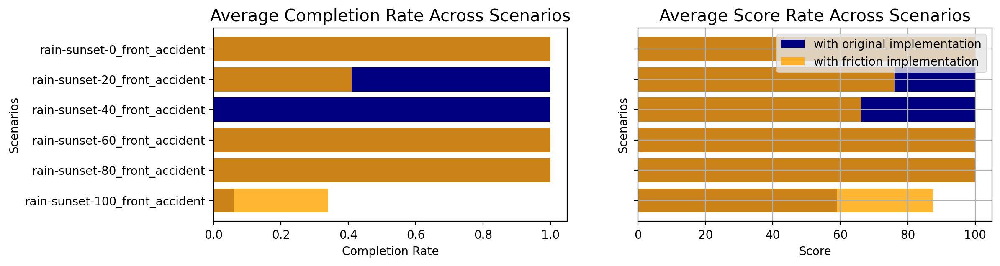

In [32]:
friction_legend = ["with original implementation", "with friction implementation"]

plt.subplots(1, 2, sharey=True, figsize=(12,3), dpi=200)
plt.gca().invert_yaxis()
width = 0.25

plt.subplot(1, 2, 1)
plt.style.use('ggplot')
plt.barh(subfolders, avg_complete_orig, label=friction_legend[0], color="navy")
plt.barh(subfolders, avg_complete_fric, label=friction_legend[1], color="orange" , alpha = 0.8)
plt.title('Average Completion Rate Across Scenarios')
plt.ylabel('Scenarios')
plt.xlabel('Completion Rate')


plt.subplot(1, 2, 2)
plt.style.use('ggplot')
plt.barh(subfolders, avg_score_orig, label=friction_legend[0], color="navy")
plt.barh(subfolders, avg_score_fric, label=friction_legend[1], color="orange" , alpha = 0.8)
plt.title('Average Score Rate Across Scenarios')
plt.ylabel('Scenarios')
plt.xlabel('Score')

plt.grid()

plt.legend()
plt.show()

## Comparison

In [33]:
attribute_order = ["x", "y", "v", "cvip", "steer", "brake", "throttle"]

all_medians = np.empty((len(txt_lists_fric), len(attribute_order), 2), dtype=object)
# [[[], []] * len(attribute_order)  for i in range(len(txt_lists_fric))]

all_medians

array([[[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]]], dtype=object)

In [34]:
full_legend = subfolders.copy()

### x,y traces

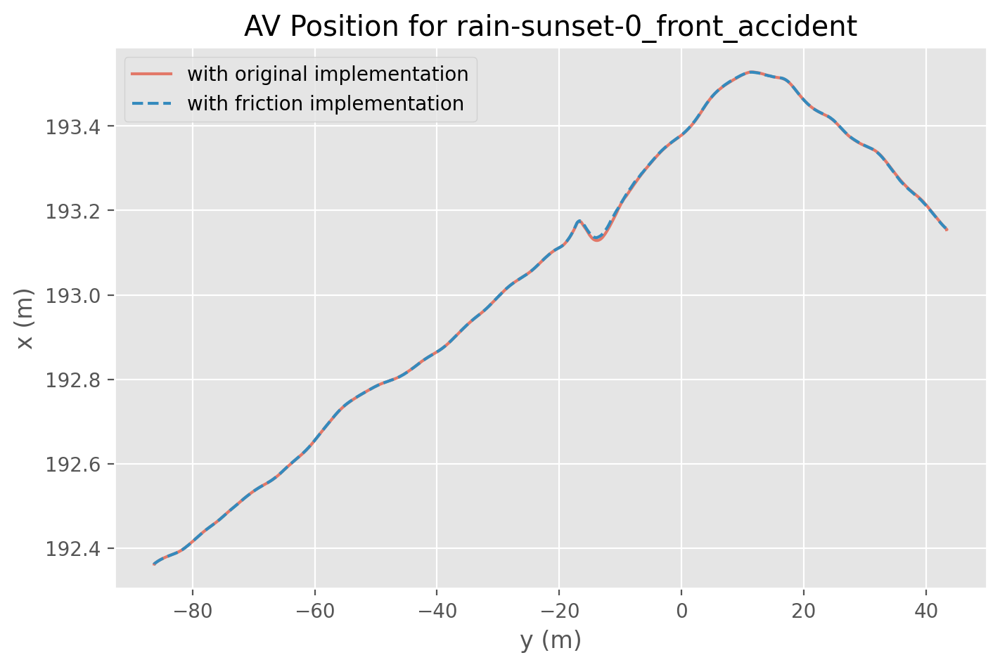

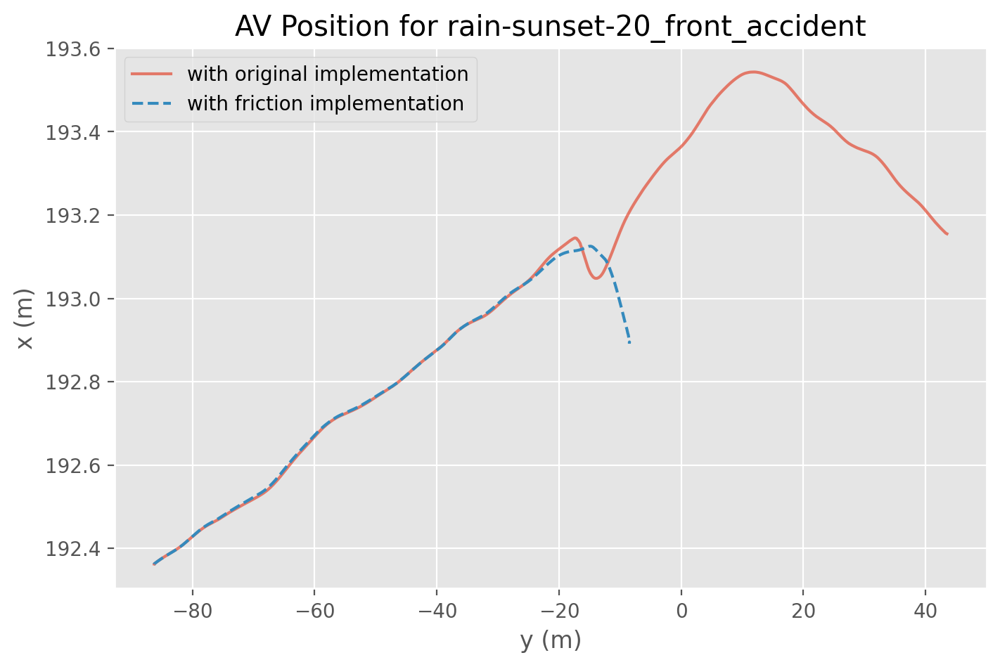

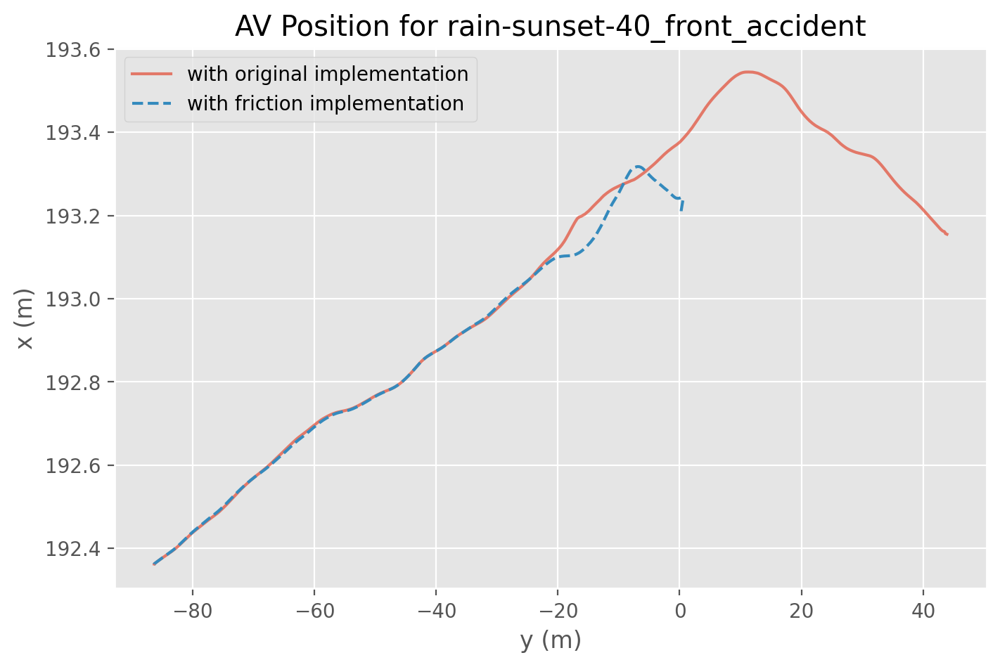

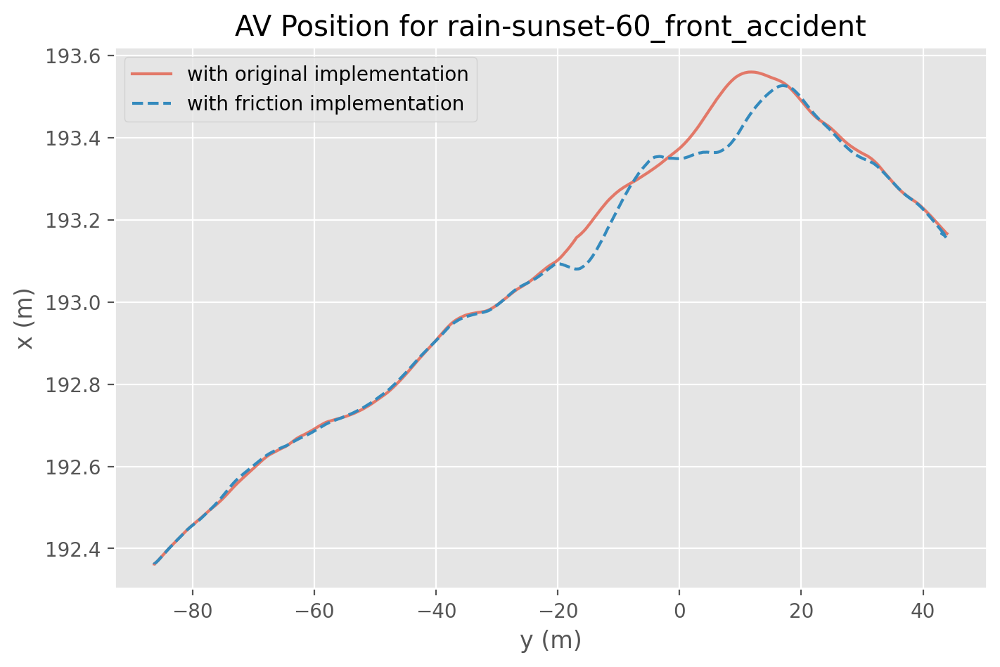

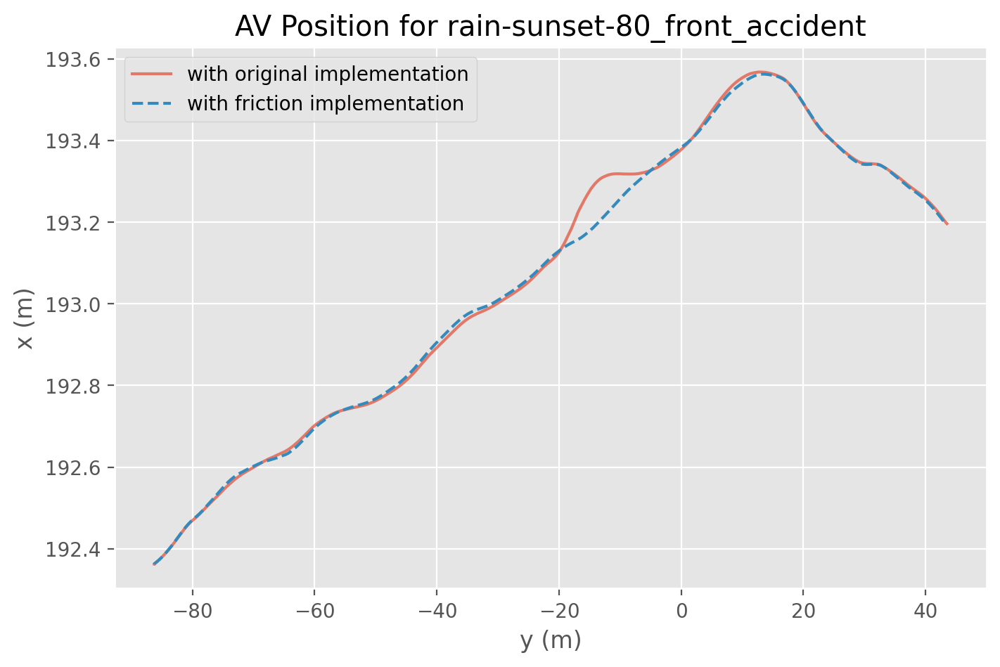

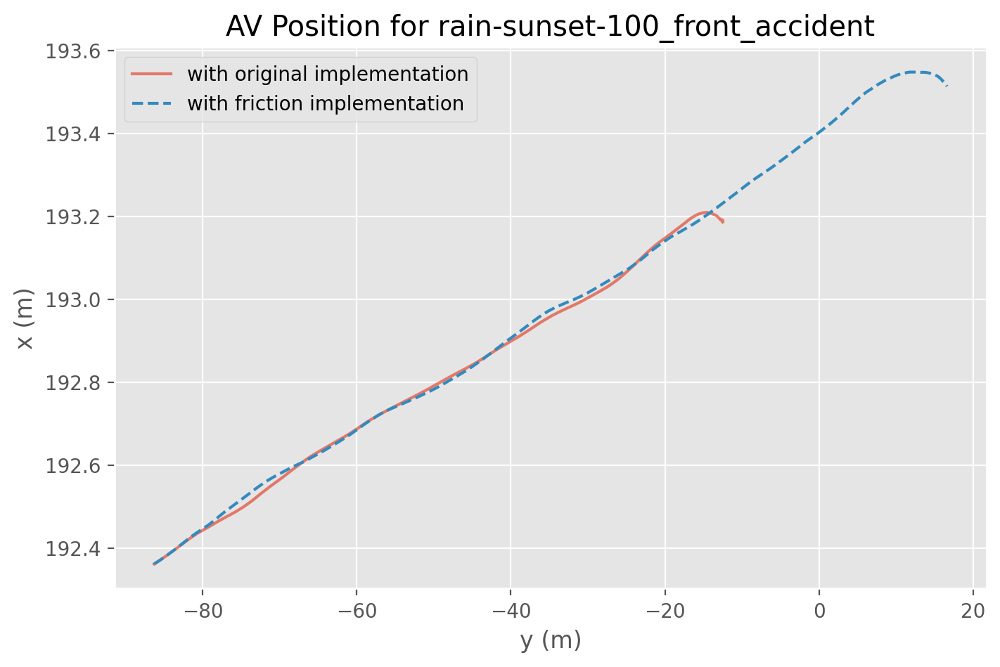

In [35]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_x = pd.DataFrame()
    df_orig_y = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['x'].dtypes == 'object' or df_array_orig[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['x'].isnull().values.any() and not df_array_orig[weather][i]['y'].isnull().values.any():
                df_orig_x["Run"+str(i)] = df_array_orig[weather][i]['x']
                df_orig_y["Run"+str(i)] = df_array_orig[weather][i]['y']

    median_orig_x = df_orig_x.median(axis=1)
    median_orig_y = df_orig_y.median(axis=1)

    plt.plot(median_orig_y, median_orig_x, alpha=0.7)


    df_fric_x = pd.DataFrame()
    df_fric_y = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['x'].dtypes == 'object' or df_array_fric[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['x'].isnull().values.any() and not df_array_fric[weather][i]['y'].isnull().values.any():
                df_fric_x["Run"+str(i)] = df_array_fric[weather][i]['x']
                df_fric_y["Run"+str(i)] = df_array_fric[weather][i]['y']

    median_fric_x = df_fric_x.median(axis=1)
    median_fric_y = df_fric_y.median(axis=1)

    
    all_medians[weather][0][0] = median_orig_x
    all_medians[weather][0][1] = median_fric_x
    all_medians[weather][1][0] = median_orig_y
    all_medians[weather][1][1] = median_fric_y
    
    plt.plot(median_fric_y, median_fric_x, '--')
    plt.xlabel("y (m)")
    plt.ylabel("x (m)")
    
    plt.title("AV Position for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

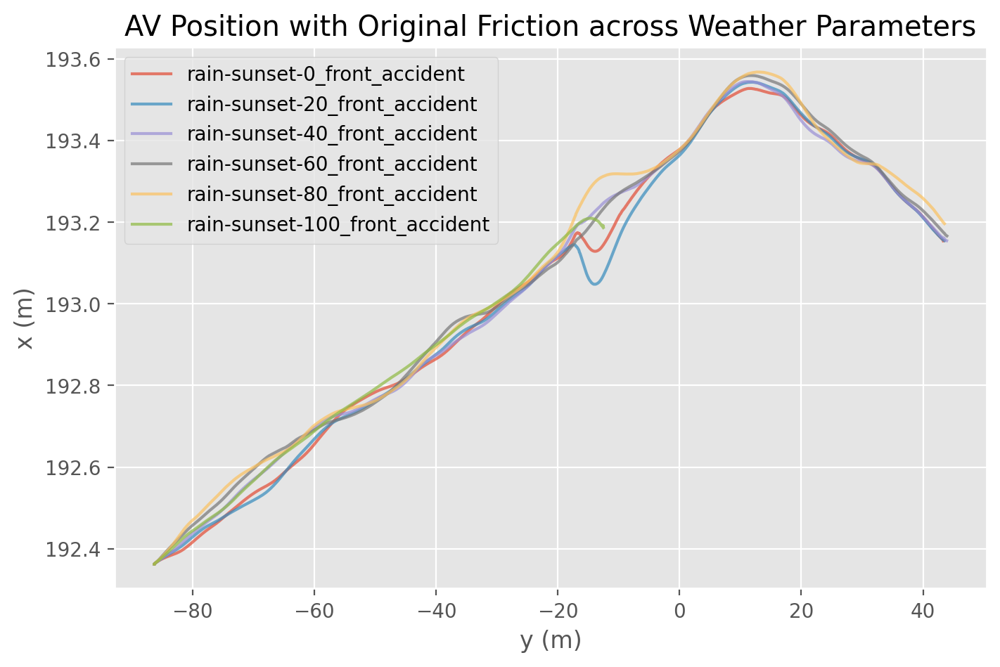

In [36]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    df_orig_x = pd.DataFrame()
    df_orig_y = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['x'].dtypes == 'object' or df_array_orig[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['x'].isnull().values.any() and not df_array_orig[weather][i]['y'].isnull().values.any():
                df_orig_x["Run"+str(i)] = df_array_orig[weather][i]['x']
                df_orig_y["Run"+str(i)] = df_array_orig[weather][i]['y']

    median_orig_x = df_orig_x.median(axis=1)
    median_orig_y = df_orig_y.median(axis=1)

    plt.plot(median_orig_y, median_orig_x, alpha=0.7)

    
# plt.axis('equal')
plt.xlabel("y (m)")
plt.ylabel("x (m)")
plt.title("AV Position with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

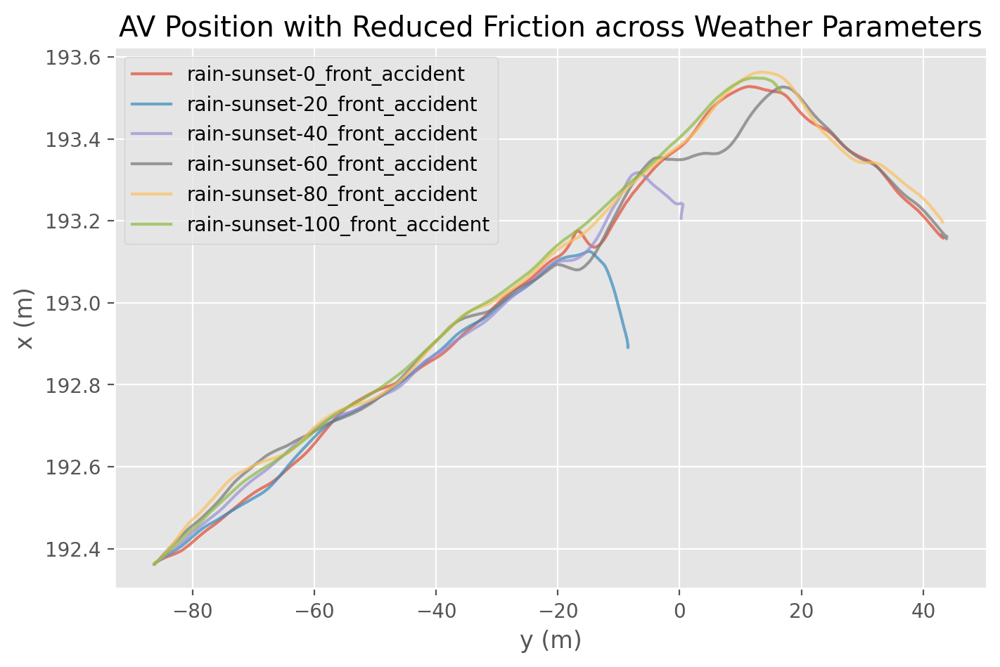

In [37]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_x = pd.DataFrame()
    df_fric_y = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['x'].dtypes == 'object' or df_array_fric[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['x'].isnull().values.any() and not df_array_fric[weather][i]['y'].isnull().values.any():
                df_fric_x["Run"+str(i)] = df_array_fric[weather][i]['x']
                df_fric_y["Run"+str(i)] = df_array_fric[weather][i]['y']

    median_fric_x = df_fric_x.median(axis=1)
    median_fric_y = df_fric_y.median(axis=1)

    plt.plot(median_fric_y, median_fric_x, alpha=0.7)
    
# plt.axis('equal')
plt.xlabel("y (m)")
plt.ylabel("x (m)")
plt.title("AV Position with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### v

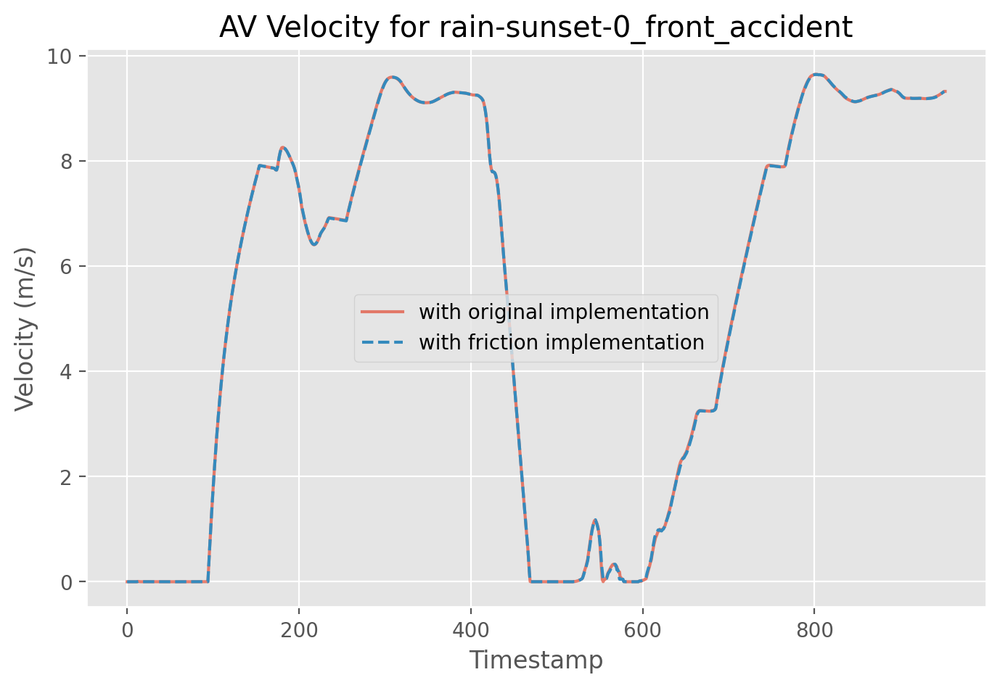

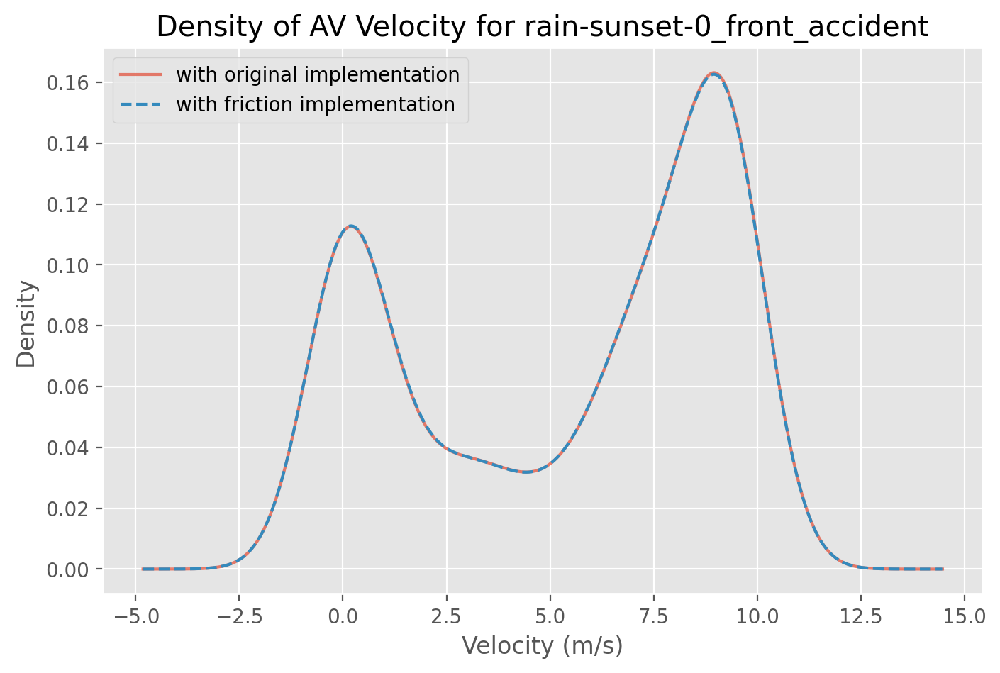

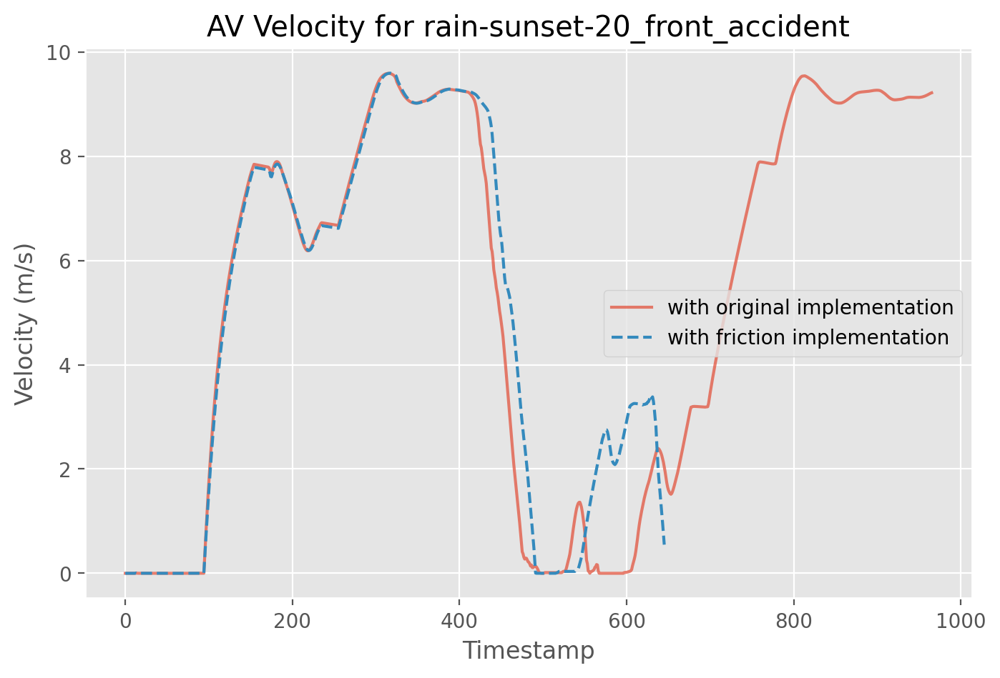

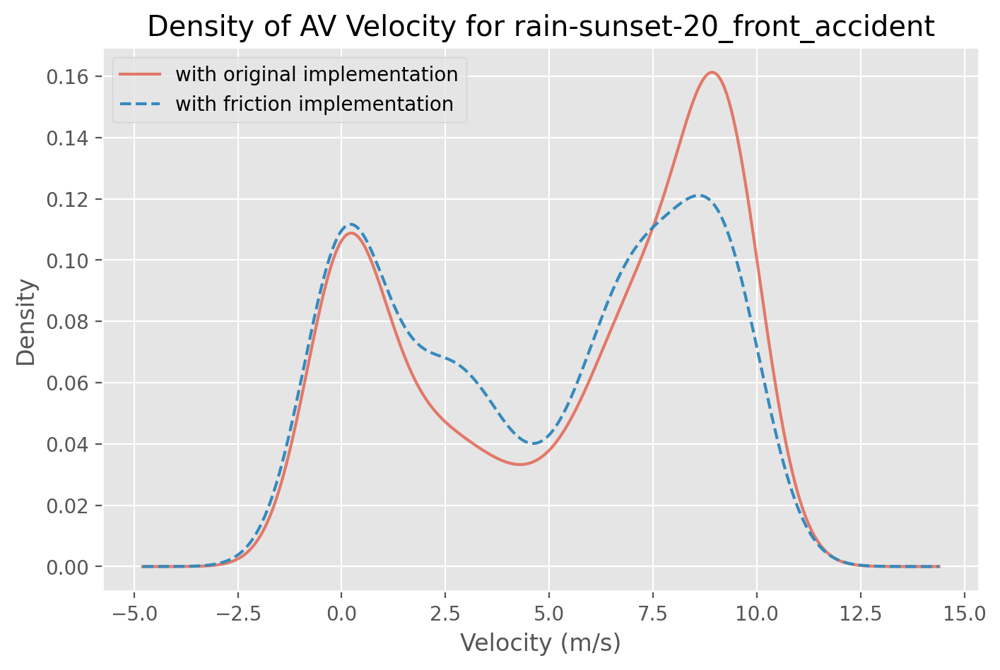

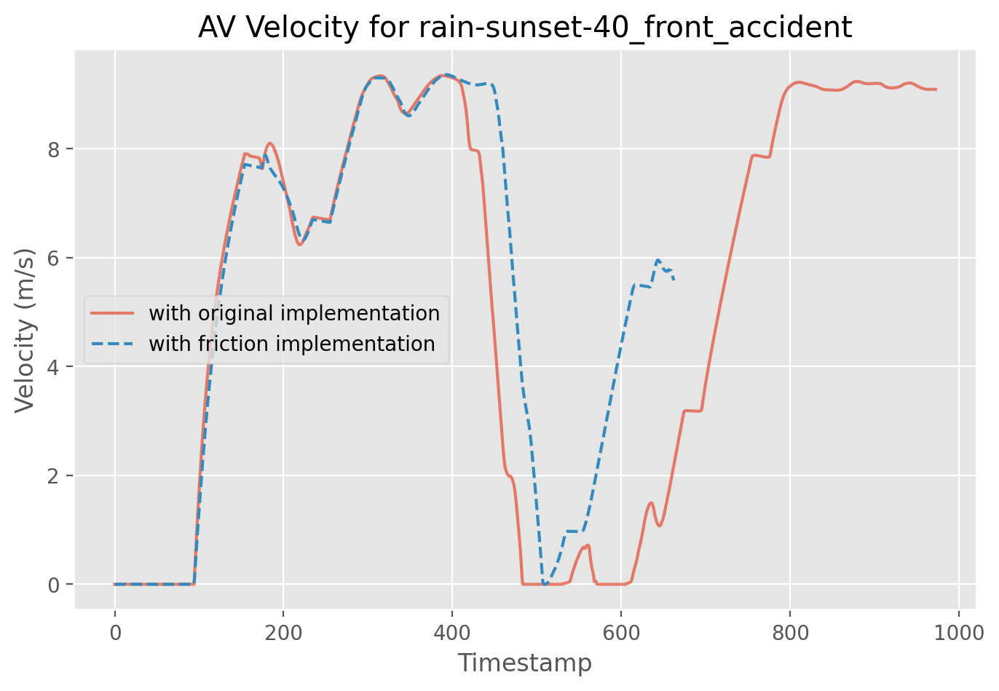

...

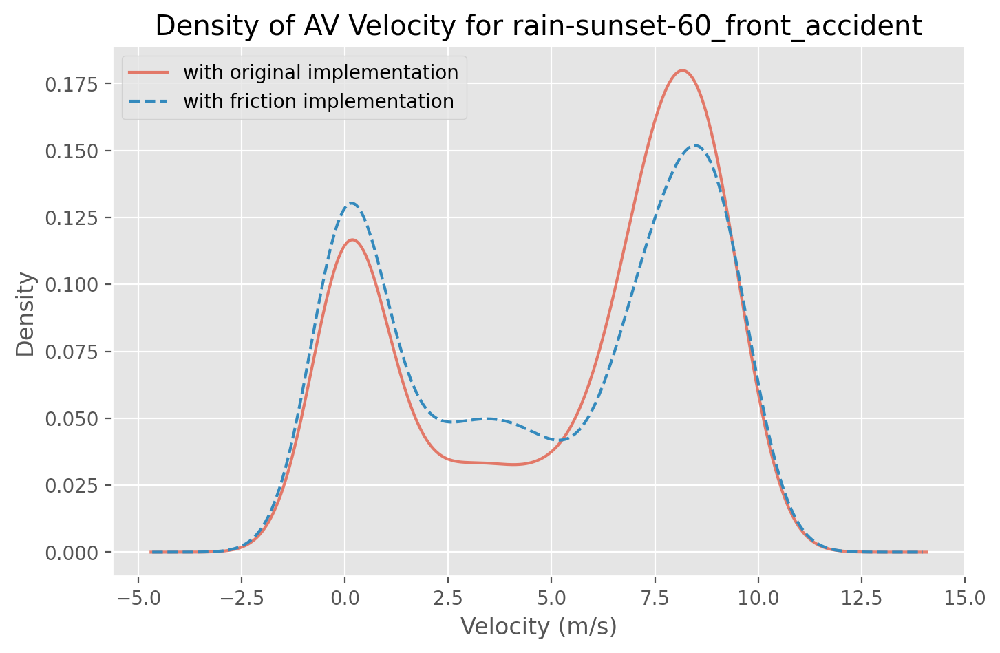

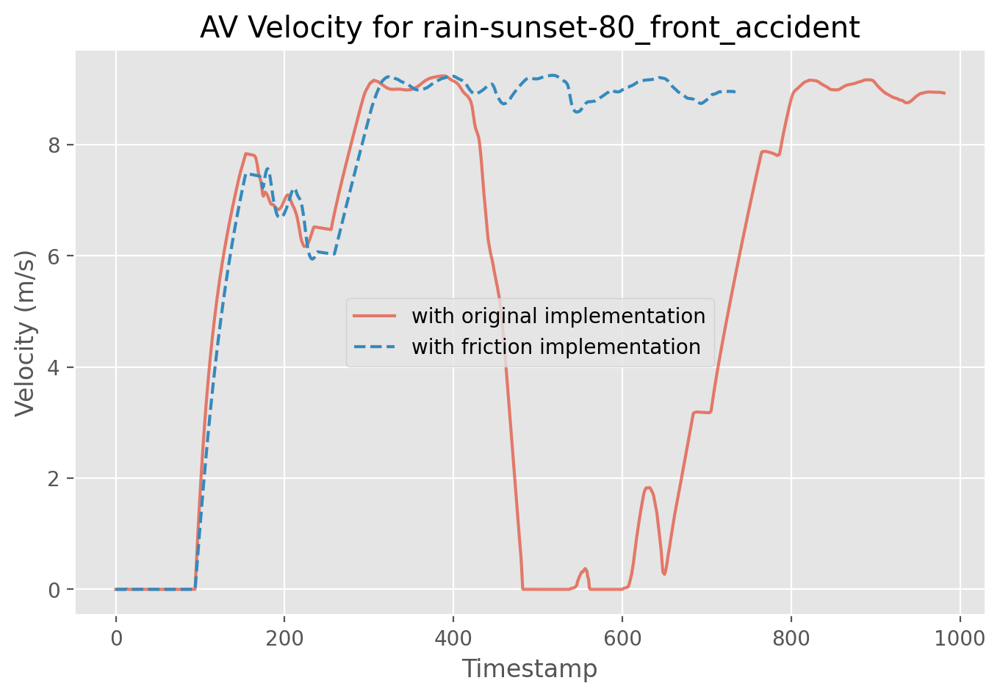

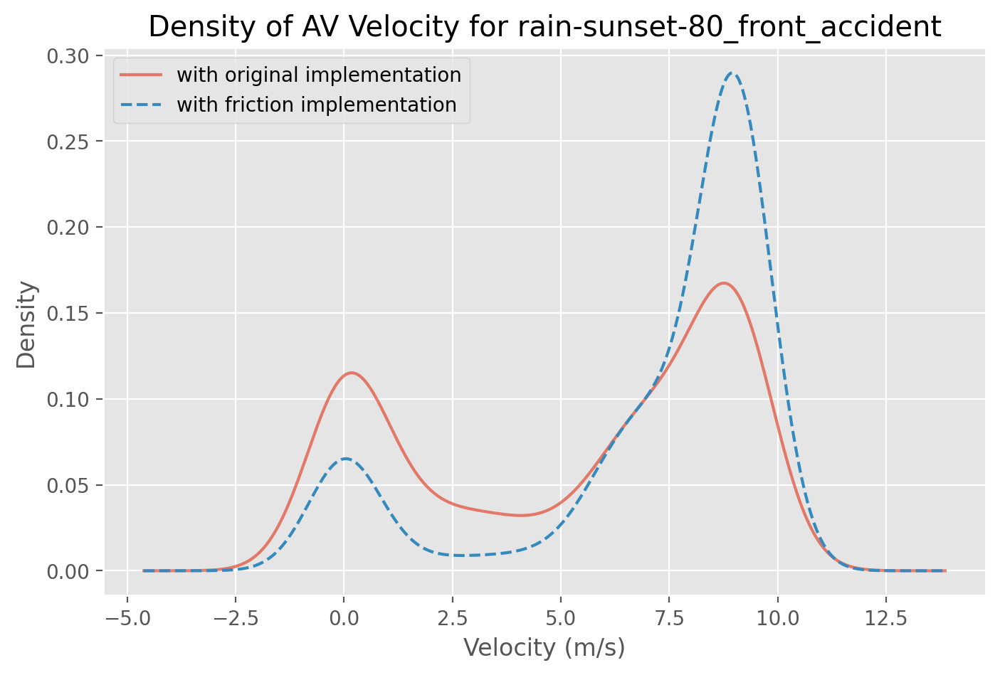

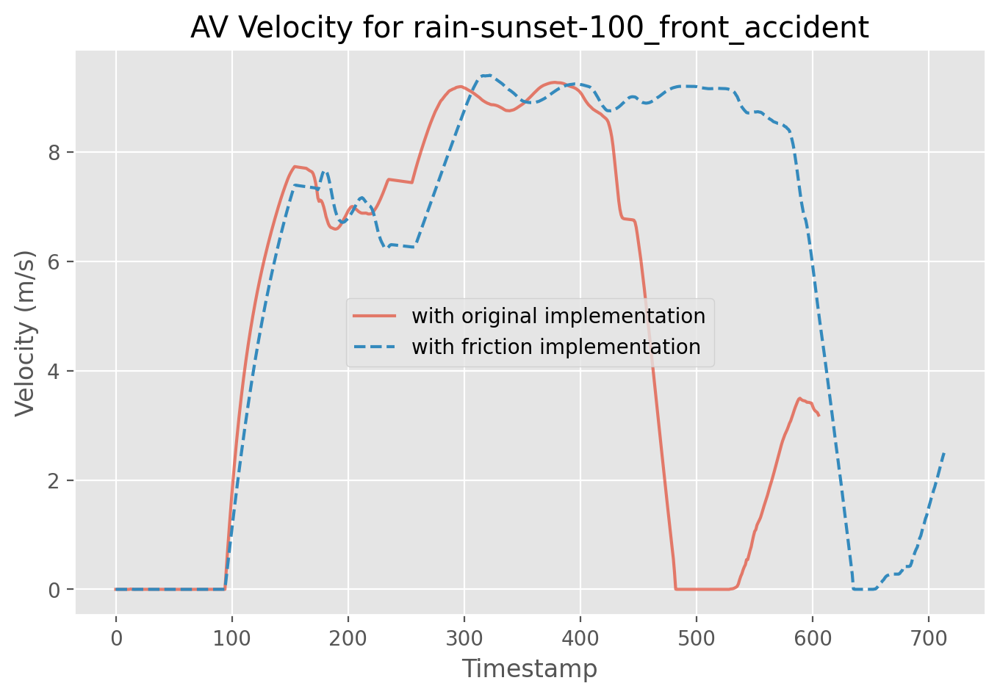

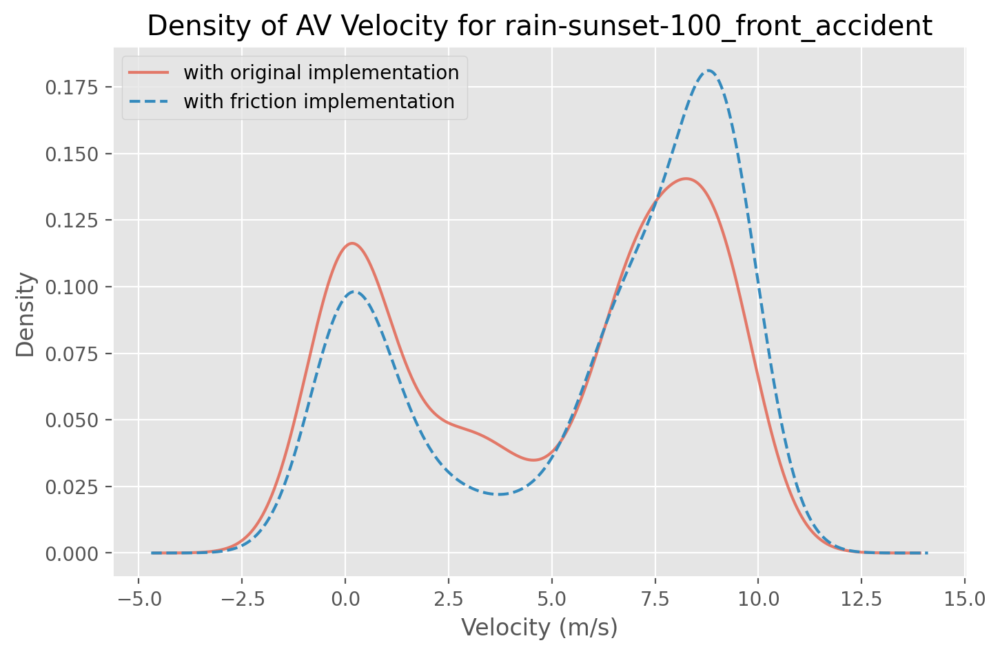

In [38]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_v = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['v'].isnull().values.any():
                df_orig_v["Run"+str(i)] = df_array_orig[weather][i]['v']

    median_orig_v = df_orig_v.median(axis=1)

    plt.plot(median_orig_v, alpha=0.7)


    df_fric_v = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['v'].isnull().values.any():
                df_fric_v["Run"+str(i)] = df_array_fric[weather][i]['v']

    median_fric_v = df_fric_v.median(axis=1)
    
    all_medians[weather][2][0] = median_orig_v
    all_medians[weather][2][1] = median_fric_v
    
    plt.plot(median_fric_v, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Velocity (m/s)")
    plt.title("AV Velocity for " + subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Velocity (m/s)")
    plt.ylabel("Density")
    median_orig_v.plot.density(alpha=0.7)
    median_fric_v.plot.density(style='--')
    plt.title("Density of AV Velocity for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

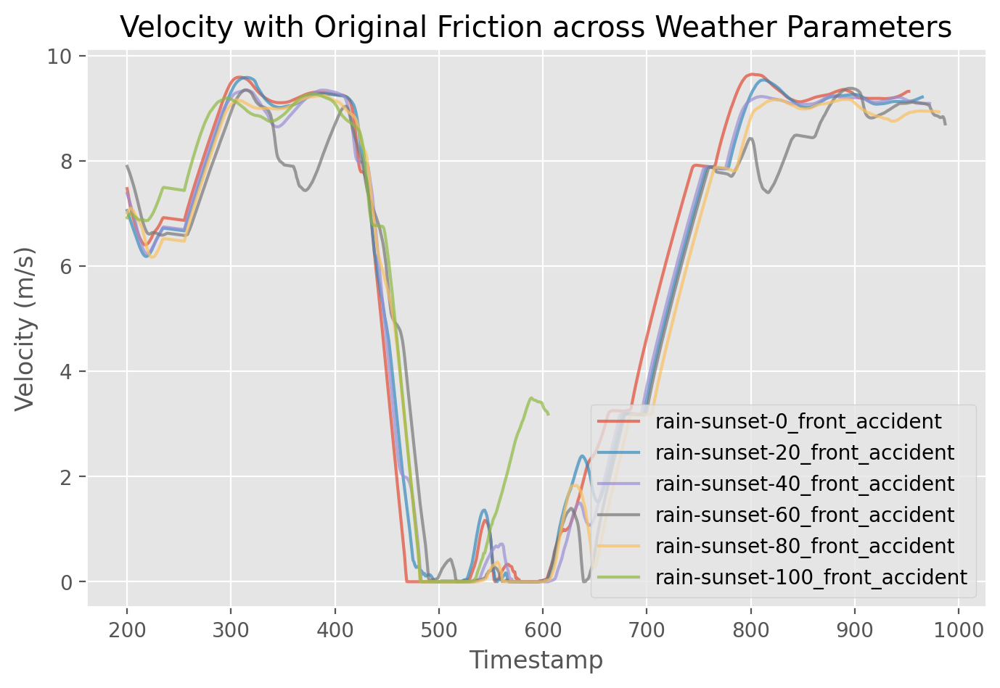

In [39]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_v = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['v'].dtypes == 'v'):
            print(i)
        else:
            if not df_array_orig[weather][i]['v'].isnull().values.any():
                df_orig_v["Run"+str(i)] = df_array_orig[weather][i]['v']

    median_orig_v = df_orig_v.median(axis=1)


    plt.plot(median_orig_v[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Velocity (m/s)")
plt.title("Velocity with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

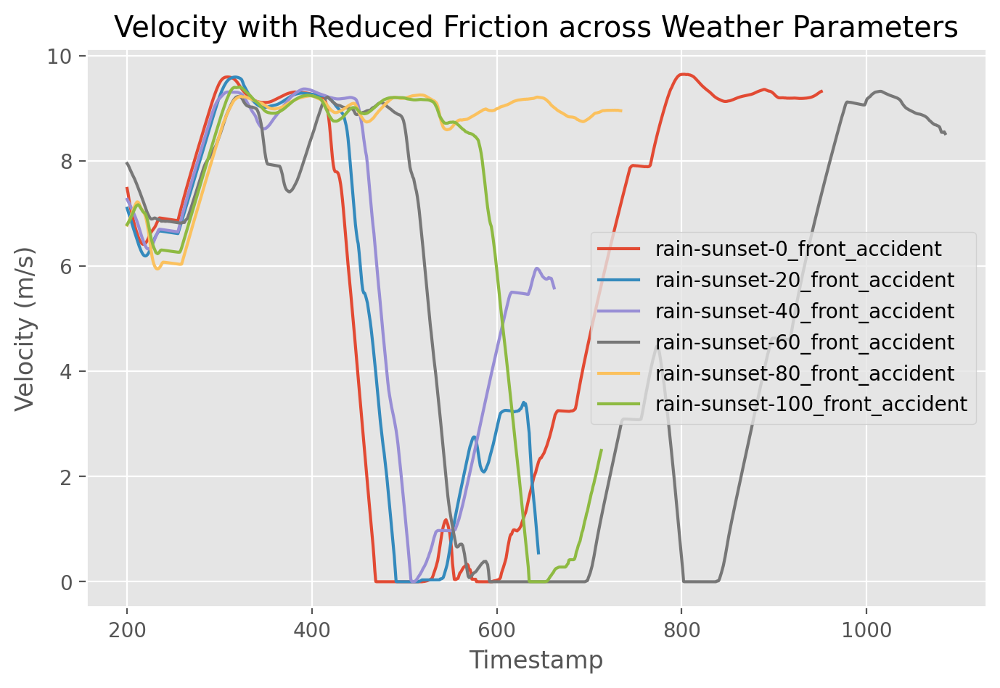

In [40]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_v = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['v'].isnull().values.any() :
                df_fric_v["Run"+str(i)] = df_array_fric[weather][i]['v']

    median_fric_v = df_fric_v.median(axis=1)

    plt.plot(median_fric_v[200:])

    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("Velocity (m/s)")
plt.title("Velocity with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### cvip

0      501.097173
1       13.812594
2       13.811309
3       13.810197
4       13.809258
          ...    
947     39.780841
948     39.812197
949     39.865450
950     39.917942
951     39.975227
Length: 952, dtype: float64


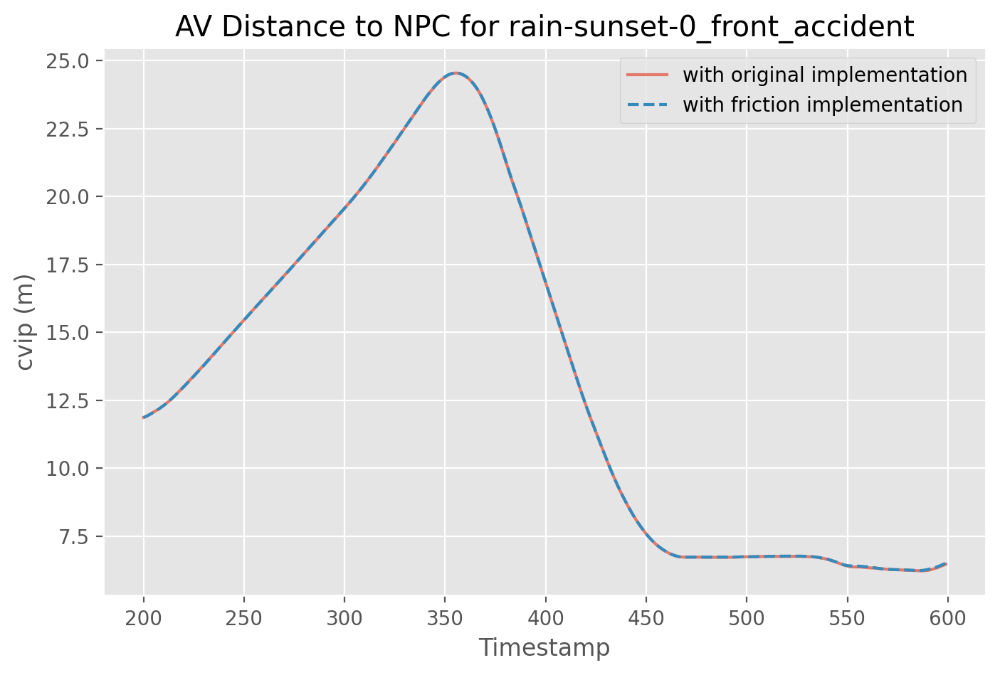

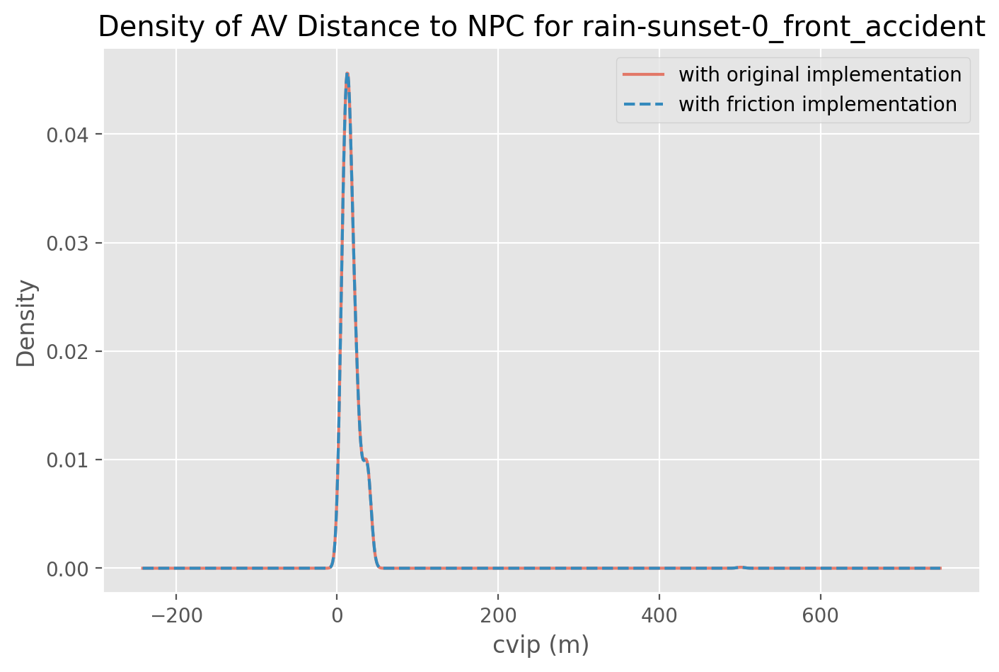

0      501.097173
1       13.812594
2       13.811309
3       13.810197
4       13.809258
          ...    
641      3.868922
642      3.998094
643      4.147684
644      4.273295
645      4.372857
Length: 646, dtype: float64


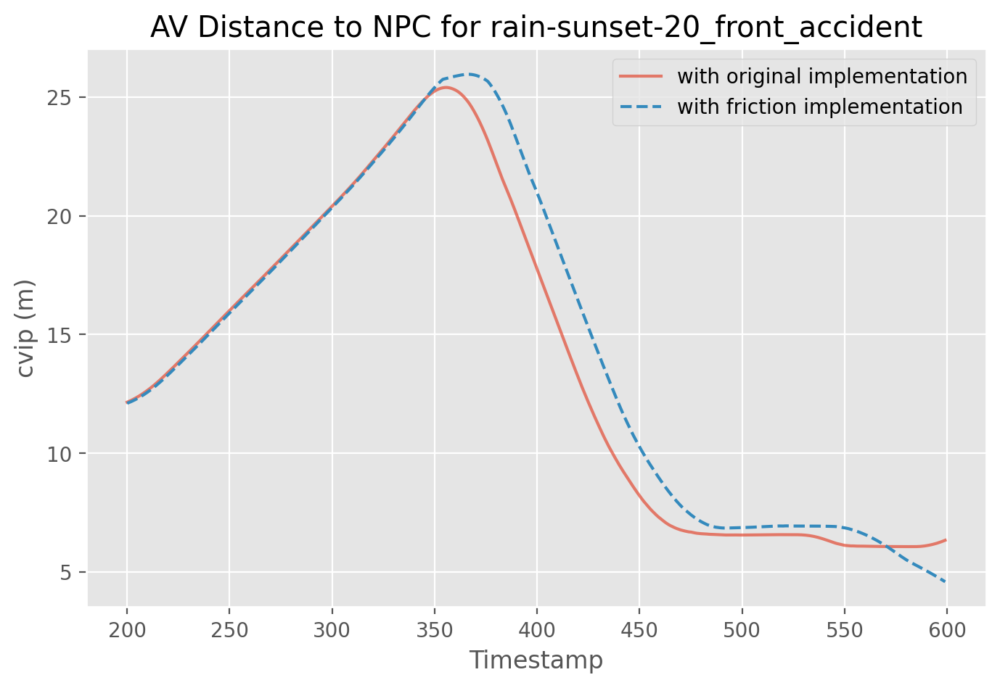

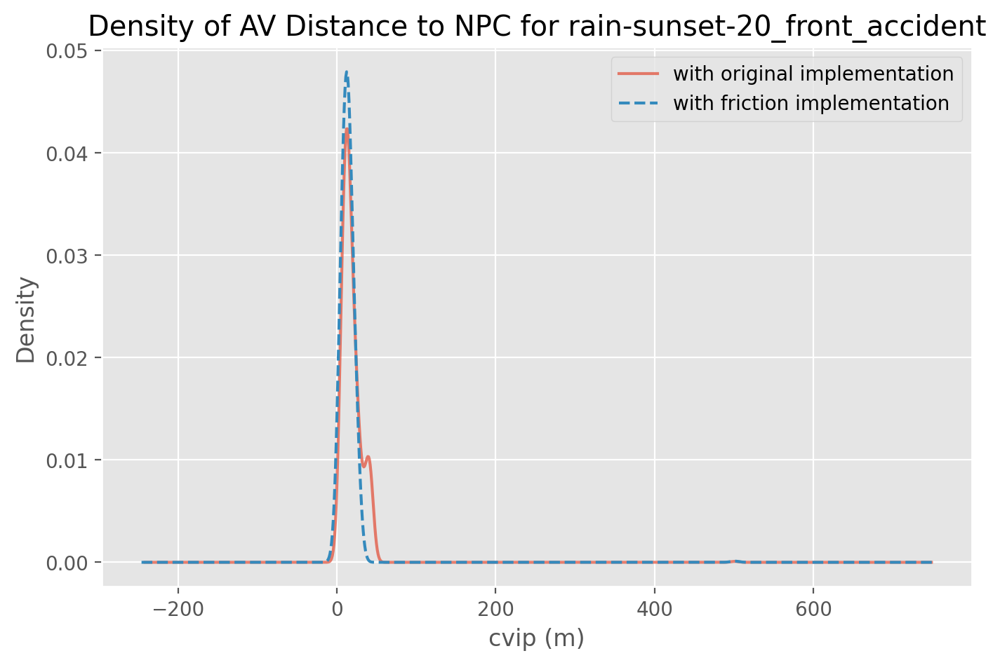

0      501.097173
1       13.812594
2       13.811309
3       13.810197
4       13.809258
          ...    
658      2.574117
659      2.536958
660      2.509284
661      2.643231
662      2.638757
Length: 663, dtype: float64


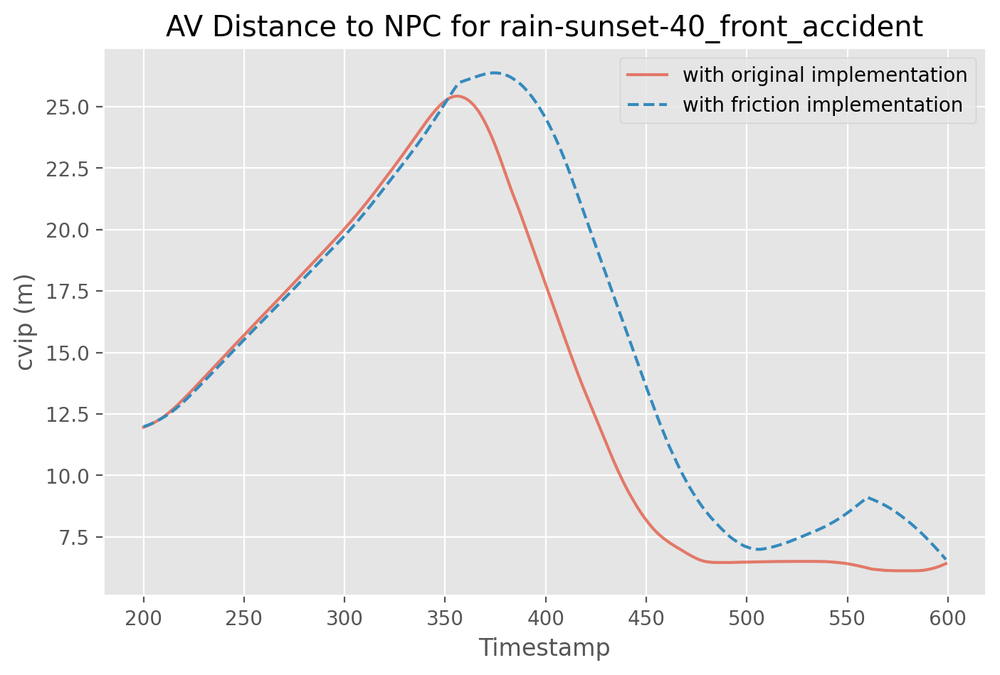

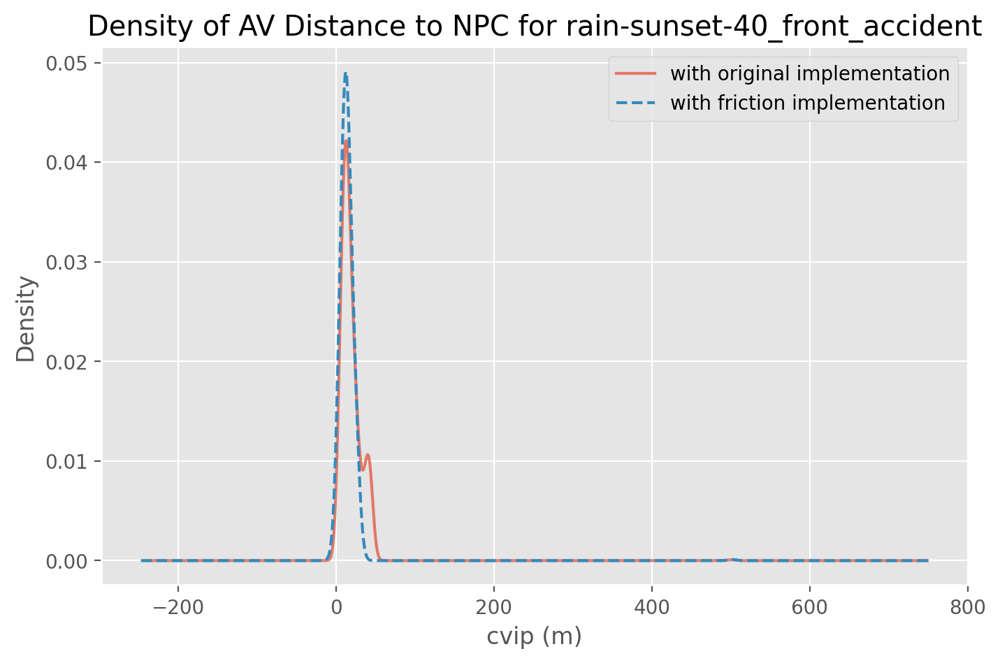

0       501.097173
1        13.812594
2        13.811309
3        13.810197
4        13.809258
           ...    
1081     23.757935
1082     23.787201
1083     23.819506
1084     23.837760
1085     23.884125
Length: 1086, dtype: float64


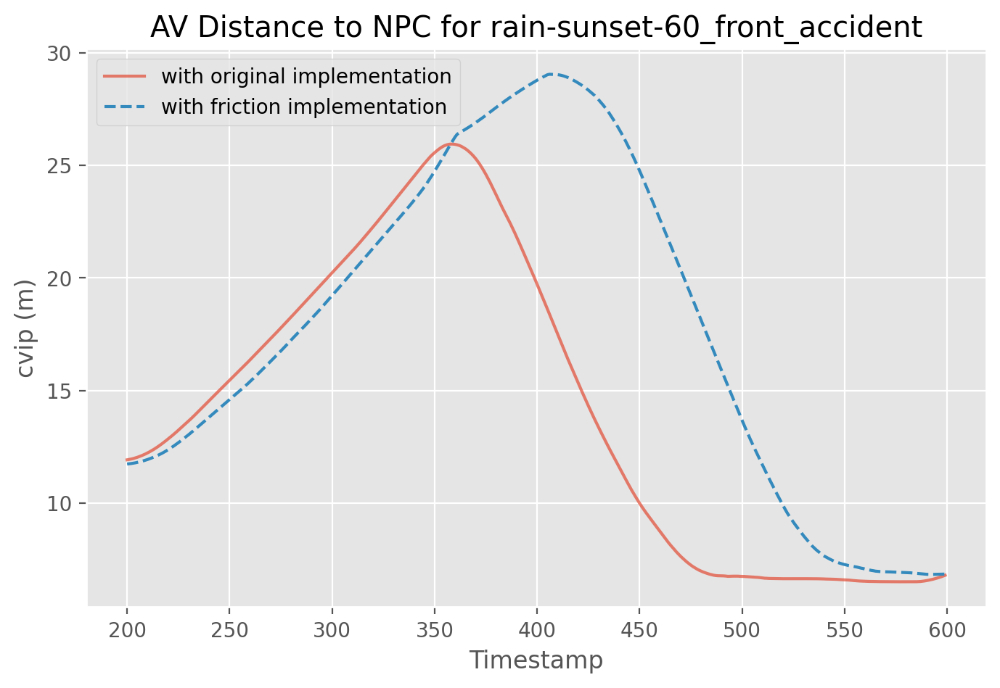

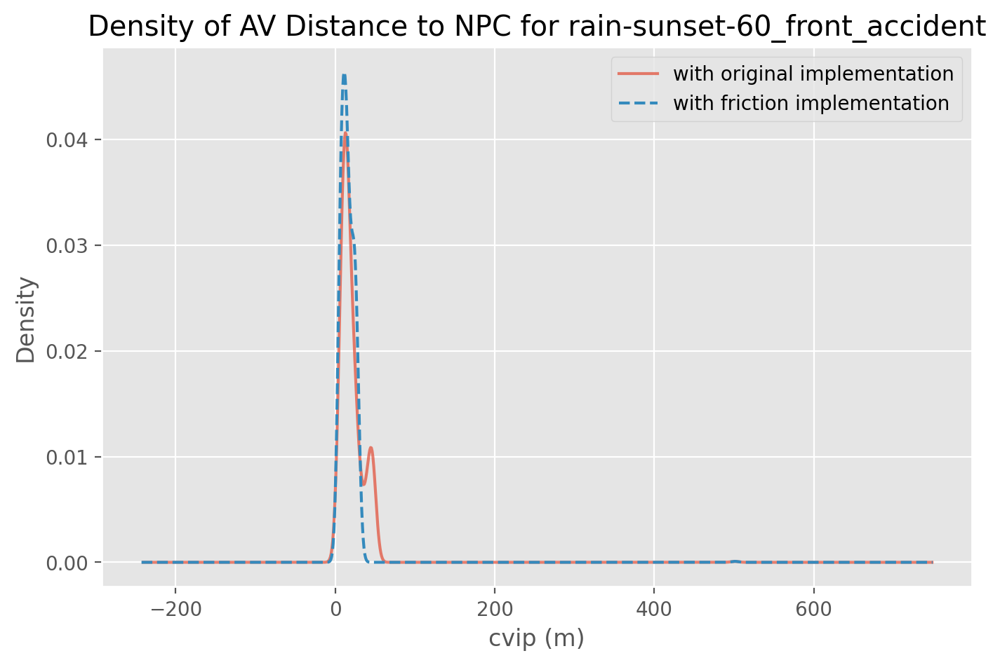

0      501.097173
1       13.812594
2       13.811309
3       13.810197
4       13.809258
          ...    
730     50.940572
731     51.035182
732     51.128663
733     51.265858
734     51.391419
Length: 735, dtype: float64


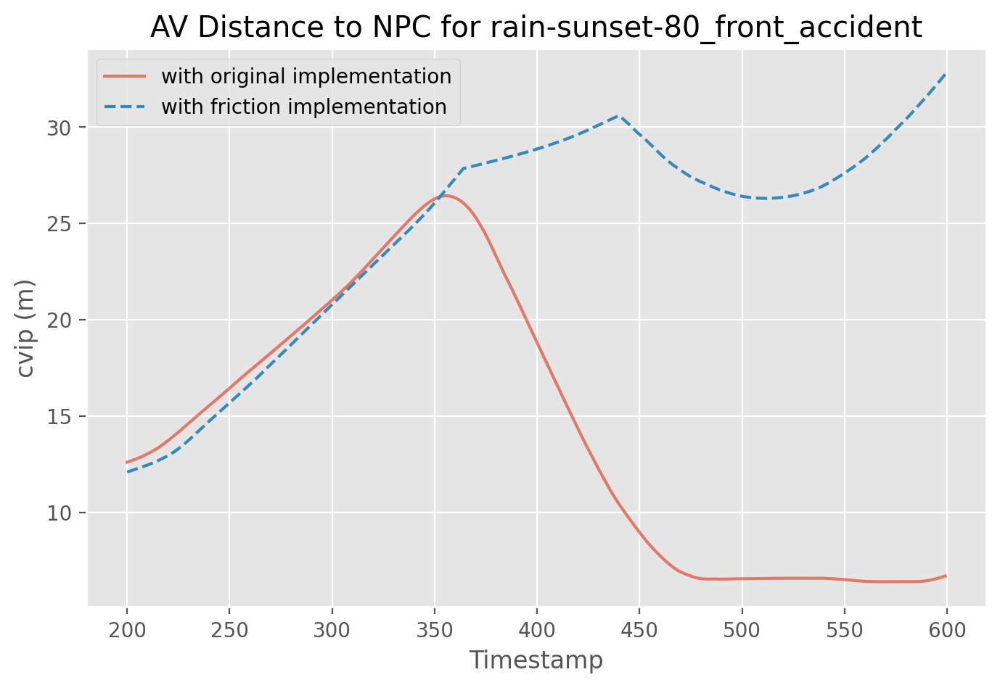

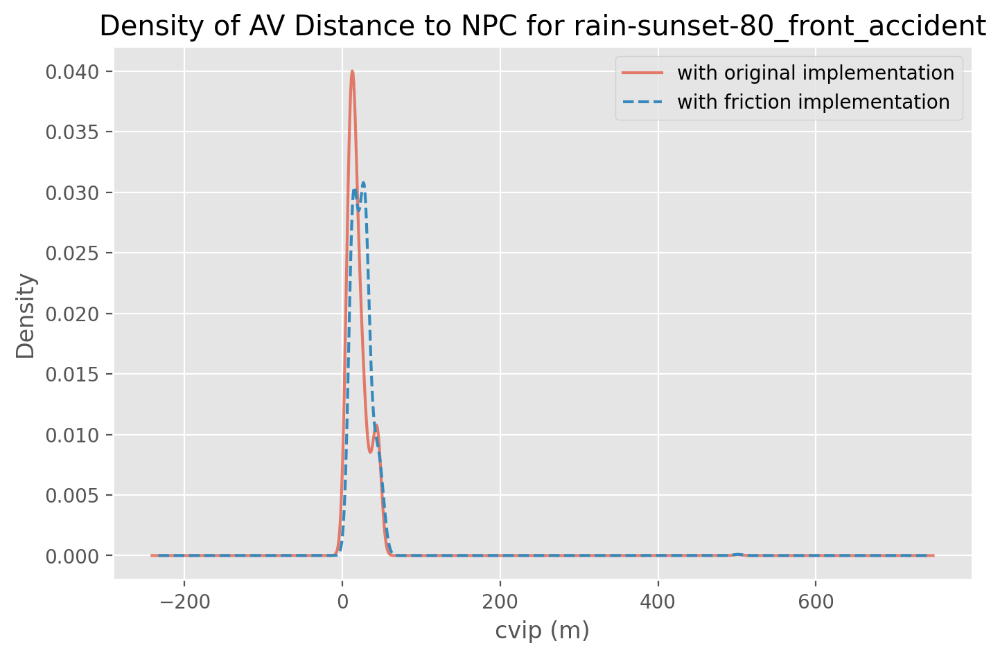

0      501.097173
1       13.812594
2       13.811309
3       13.810197
4       13.809258
          ...    
709      5.105715
710      5.073306
711      5.040384
712      5.006708
713      4.978234
Length: 714, dtype: float64


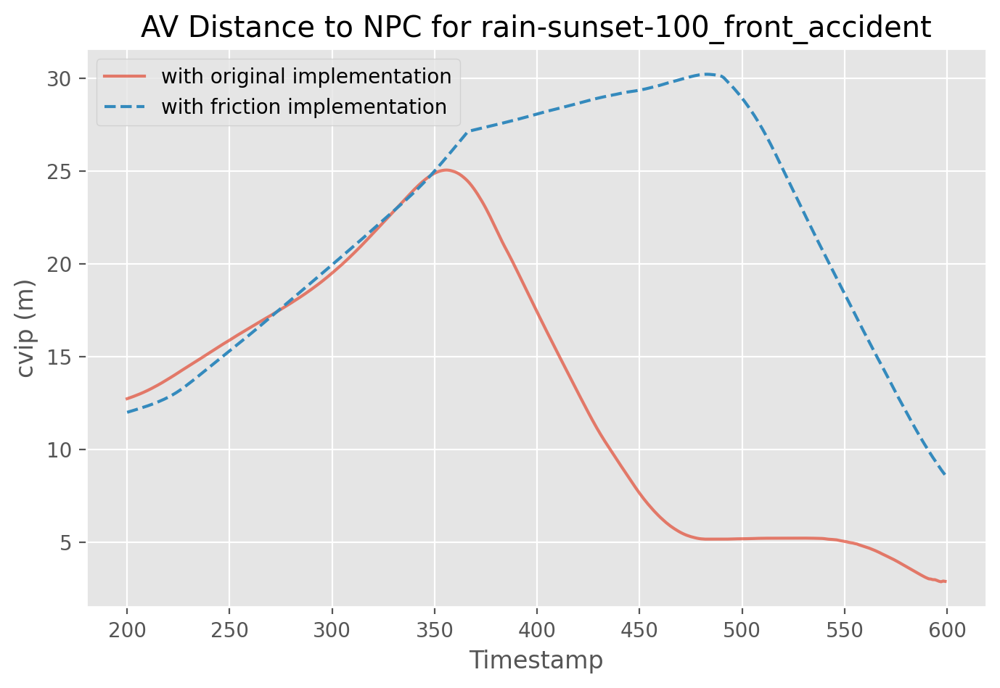

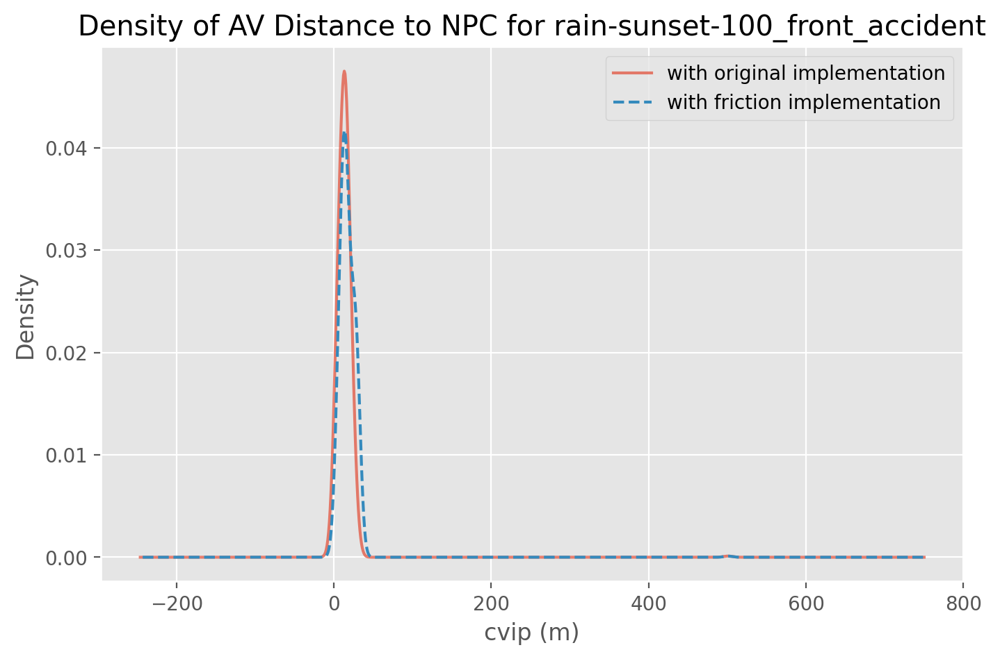

In [41]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_cvip = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['cvip'].isnull().values.any():
                df_orig_cvip["Run"+str(i)] = df_array_orig[weather][i]['cvip']

    median_orig_cvip = df_orig_cvip.median(axis=1)

    plt.plot(median_orig_cvip.iloc[200:600], alpha=0.7)


    df_fric_cvip = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['cvip'].isnull().values.any():
                df_fric_cvip["Run"+str(i)] = df_array_fric[weather][i]['cvip']

    median_fric_cvip = df_fric_cvip.median(axis=1)
    
    print(median_fric_cvip)
    
    all_medians[weather][3][0] = median_orig_cvip
    all_medians[weather][3][1] = median_fric_cvip
    
    plt.plot(median_fric_cvip.iloc[200:600], '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("cvip (m)")
    plt.title("AV Distance to NPC for " + subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("cvip (m)")
    plt.ylabel("Density")
    median_orig_cvip.plot.density(alpha=0.7)
    median_fric_cvip.plot.density(style='--')
    plt.title("Density of AV Distance to NPC for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()

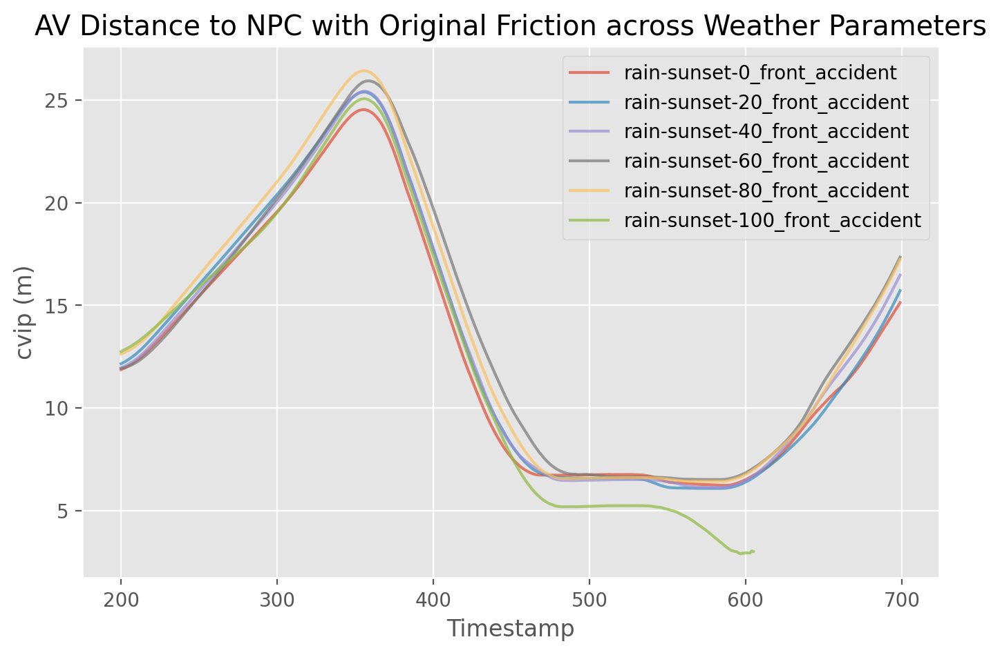

In [42]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_cvip = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['cvip'].isnull().values.any():
                df_orig_cvip["Run"+str(i)] = df_array_orig[weather][i]['cvip']

    median_orig_cvip = df_orig_cvip.median(axis=1)


    plt.plot(median_orig_cvip[200:700], alpha=0.7)



    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("cvip (m)")
plt.title("AV Distance to NPC with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

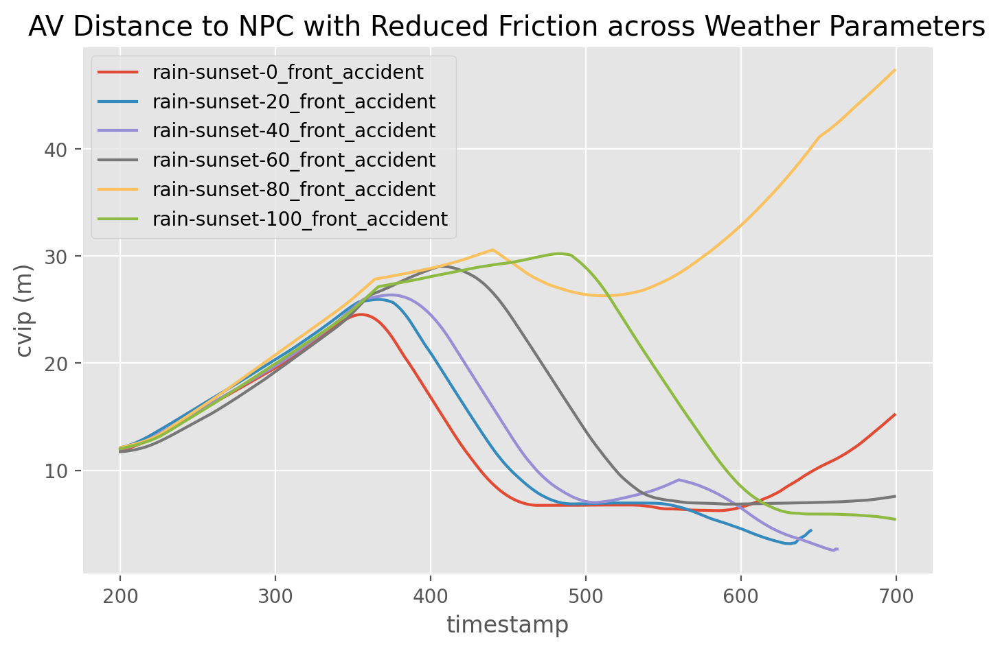

In [43]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_fric_cvip = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['cvip'].isnull().values.any() :
                df_fric_cvip["Run"+str(i)] = df_array_fric[weather][i]['cvip']

    median_fric_cvip = df_fric_cvip.median(axis=1)

    plt.plot(median_fric_cvip[200:700])

    # plt.axis('equal')
plt.xlabel("timestamp")
plt.ylabel("cvip (m)")
plt.title("AV Distance to NPC with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### steer

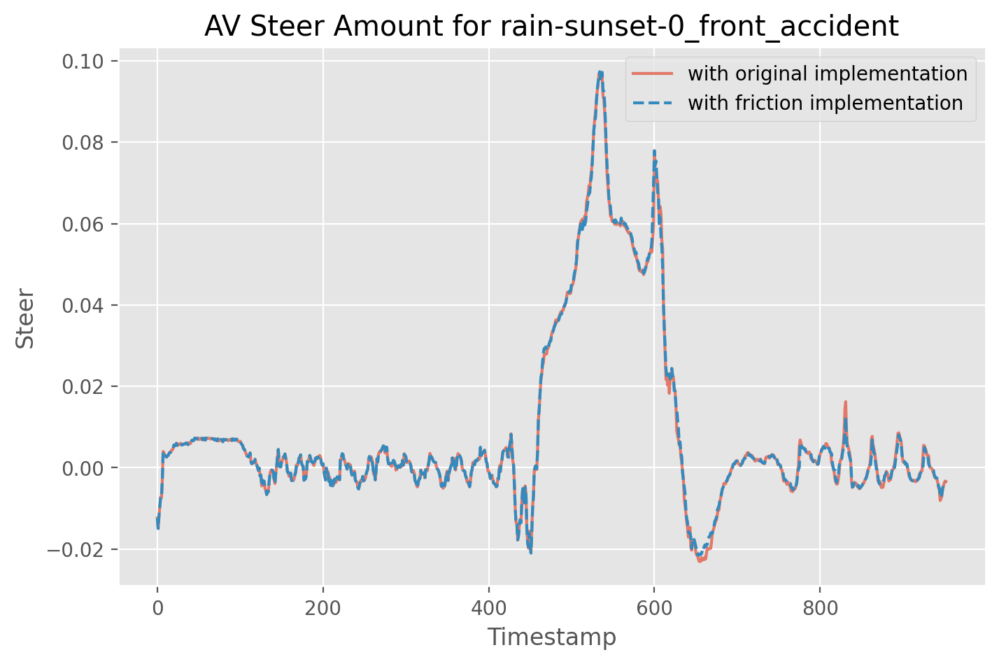

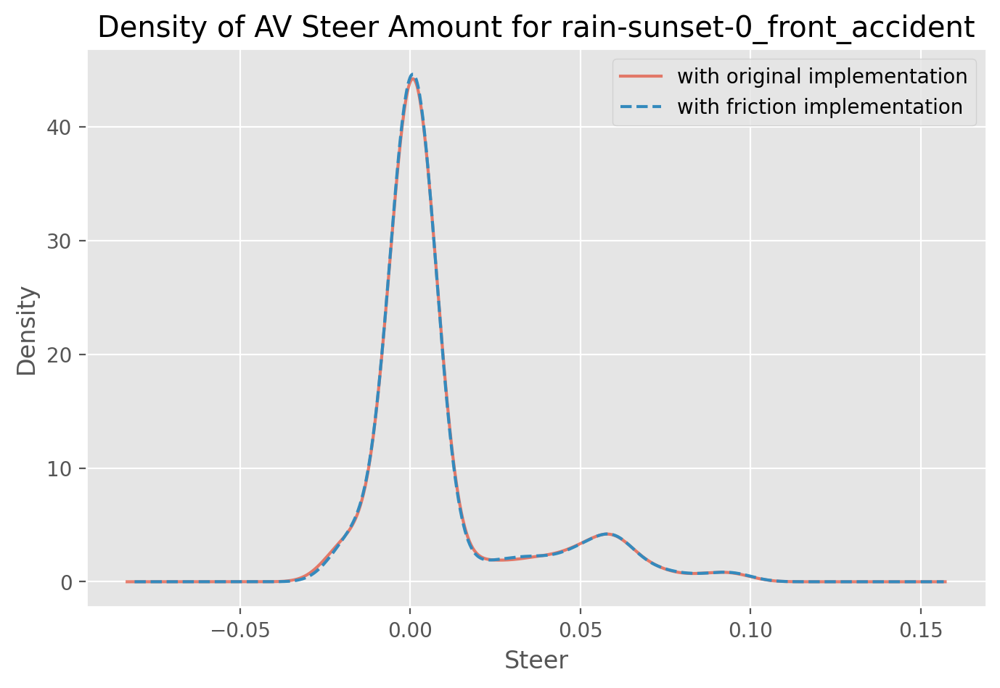

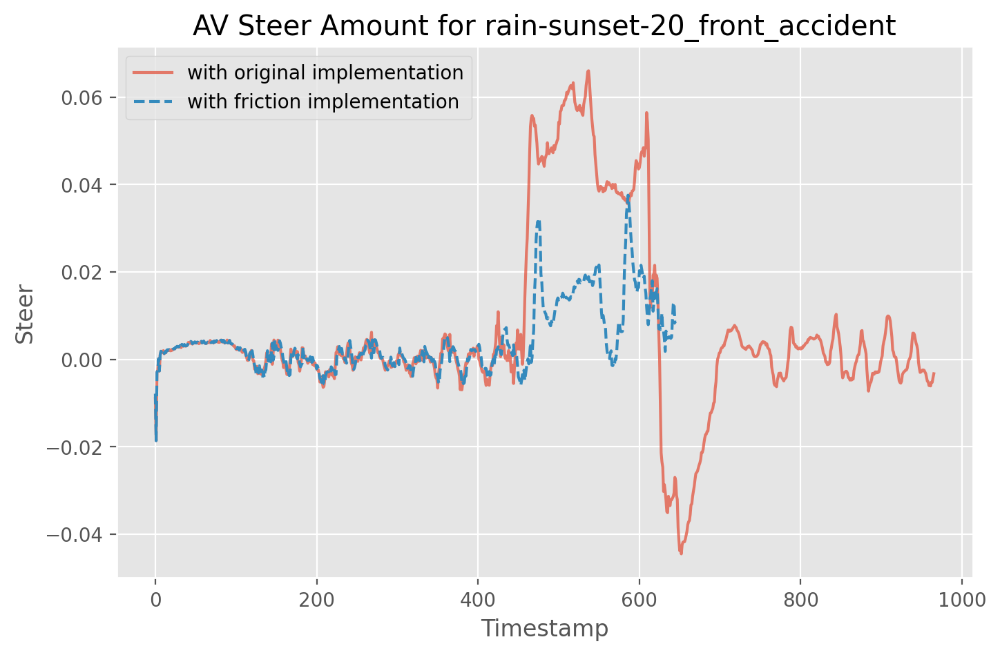

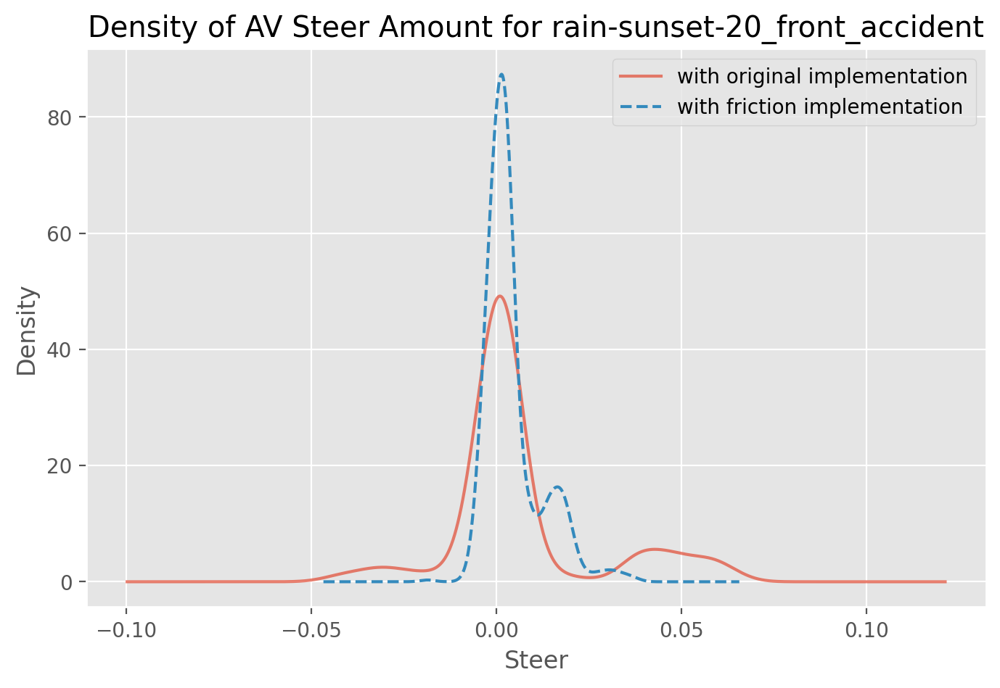

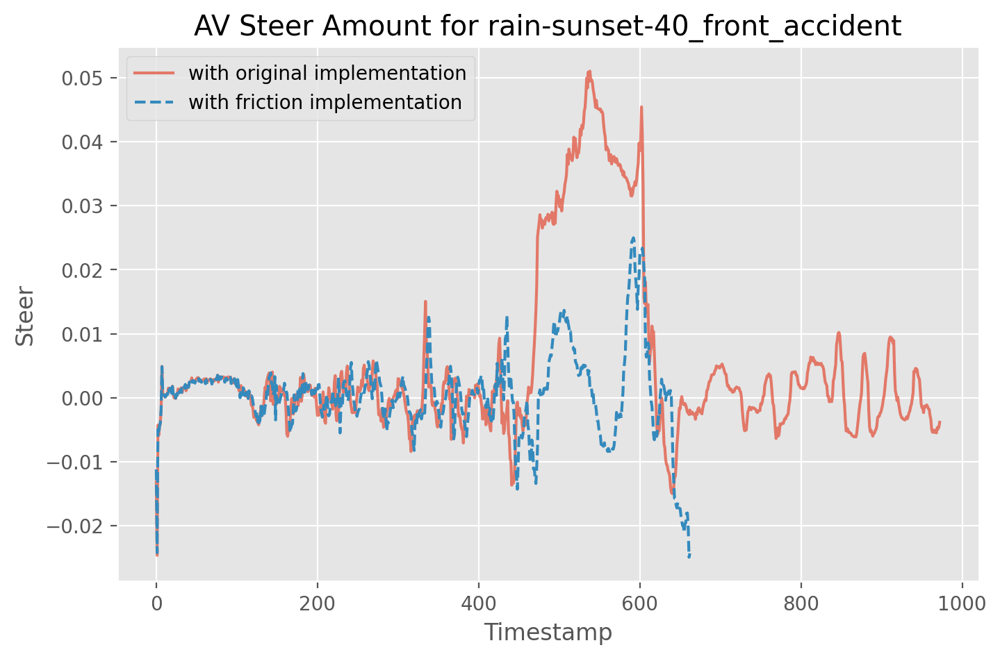

...

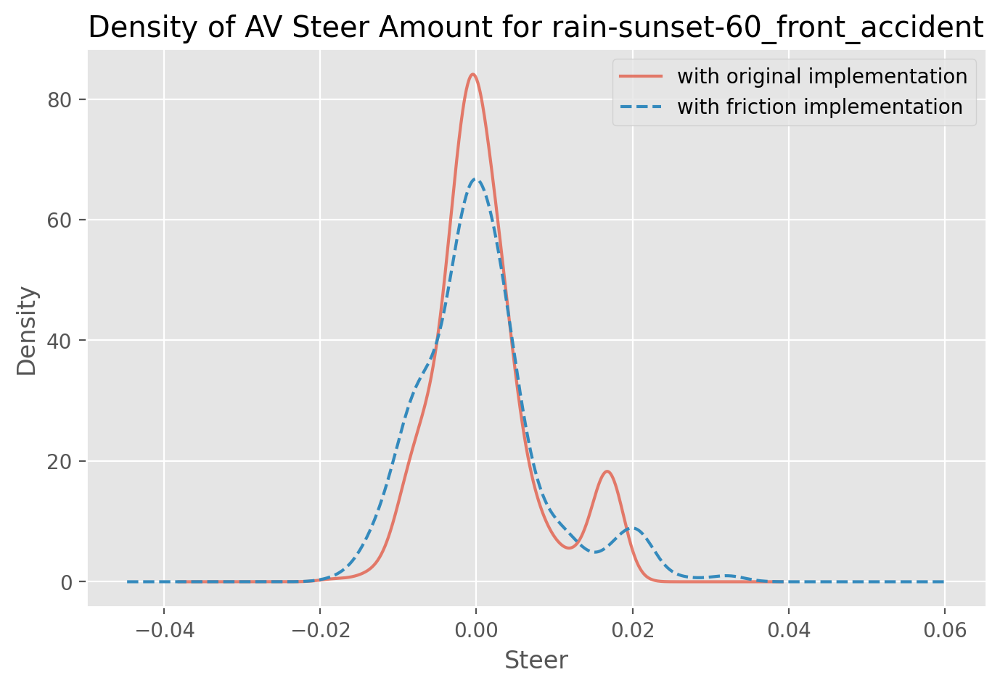

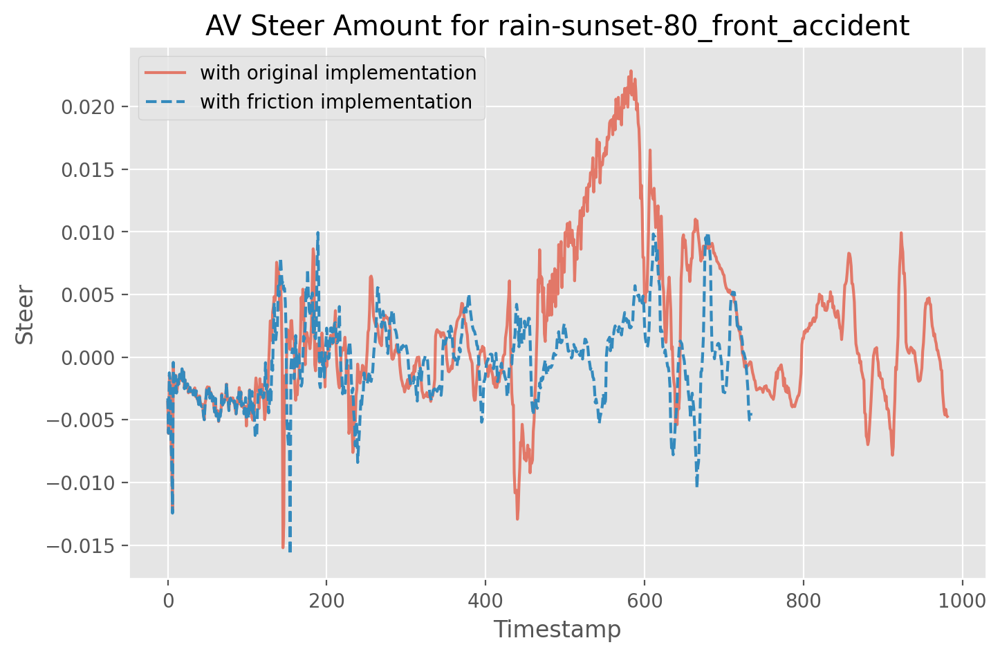

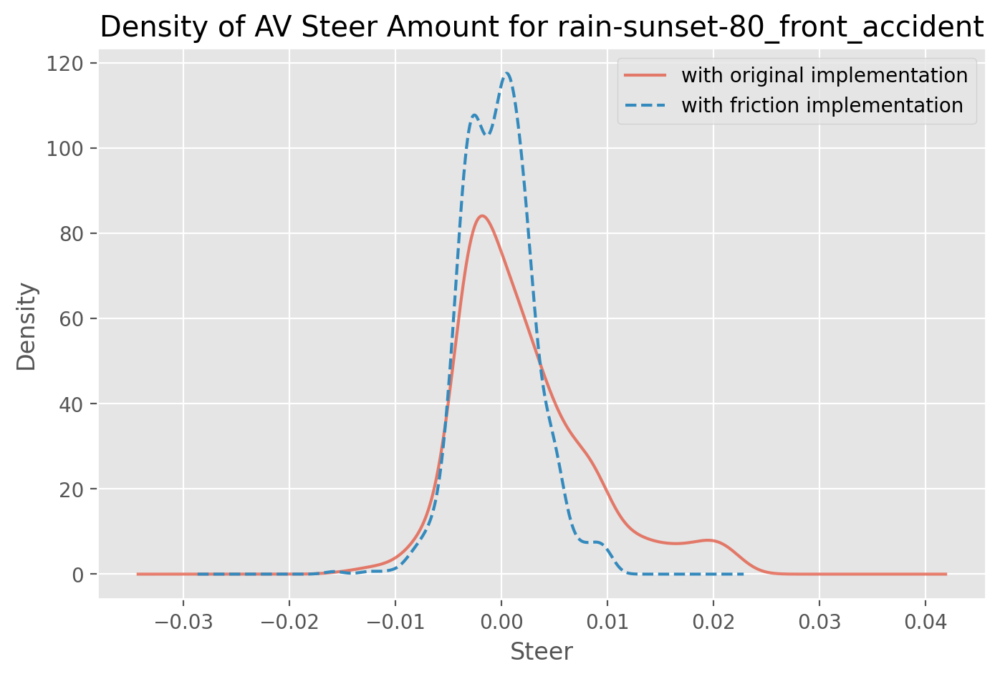

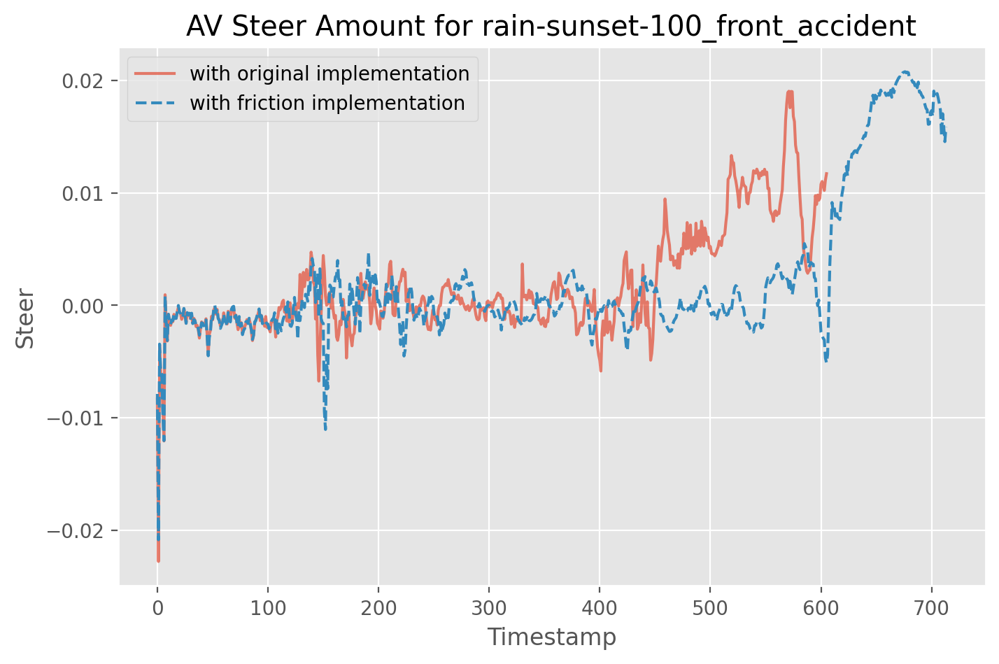

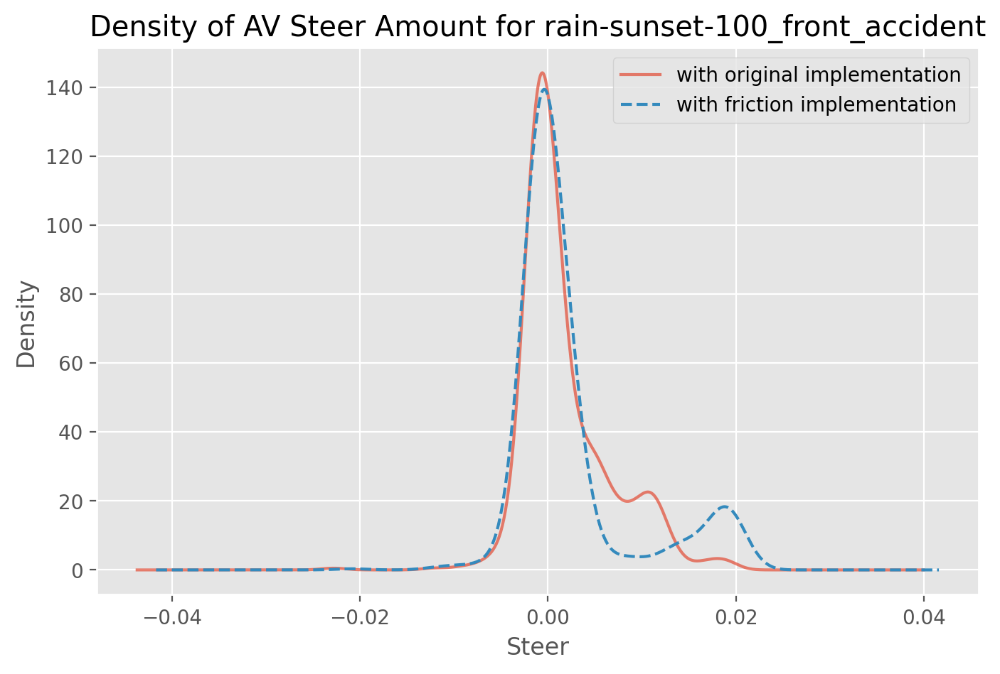

In [44]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_steer = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['steer'].isnull().values.any():
                df_orig_steer["Run"+str(i)] = df_array_orig[weather][i]['steer']

    median_orig_steer = df_orig_steer.median(axis=1)

    plt.plot(median_orig_steer, alpha=0.7)


    df_fric_steer = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['steer'].isnull().values.any():
                df_fric_steer["Run"+str(i)] = df_array_fric[weather][i]['steer']

    median_fric_steer = df_fric_steer.median(axis=1)
    
    all_medians[weather][4][0] = median_orig_steer
    all_medians[weather][4][1] = median_fric_steer
    
    plt.plot(median_fric_steer, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Steer")
    plt.title("AV Steer Amount for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Steer")
    plt.ylabel("Density")
    median_orig_steer.plot.density(alpha=0.7)
    median_fric_steer.plot.density(style='--')
    plt.title("Density of AV Steer Amount for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()

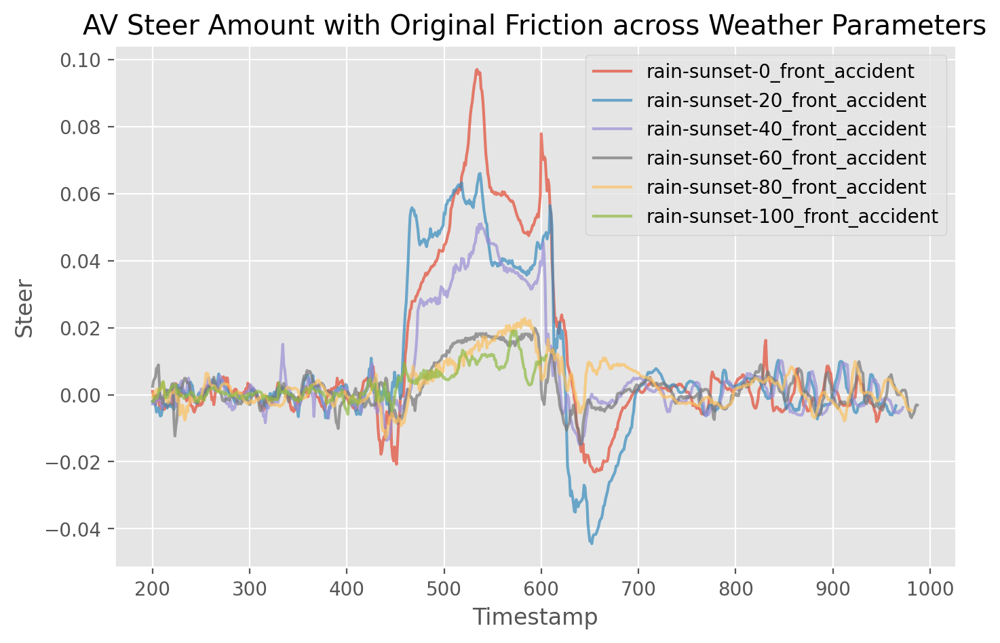

In [45]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_steer = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['steer'].dtypes == 'steer'):
            print(i)
        else:
            if not df_array_orig[weather][i]['steer'].isnull().values.any():
                df_orig_steer["Run"+str(i)] = df_array_orig[weather][i]['steer']

    median_orig_steer = df_orig_steer.median(axis=1)


    plt.plot(median_orig_steer[200:], alpha=0.7)

plt.xlabel("Timestamp")
plt.ylabel("Steer")
plt.title("AV Steer Amount with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

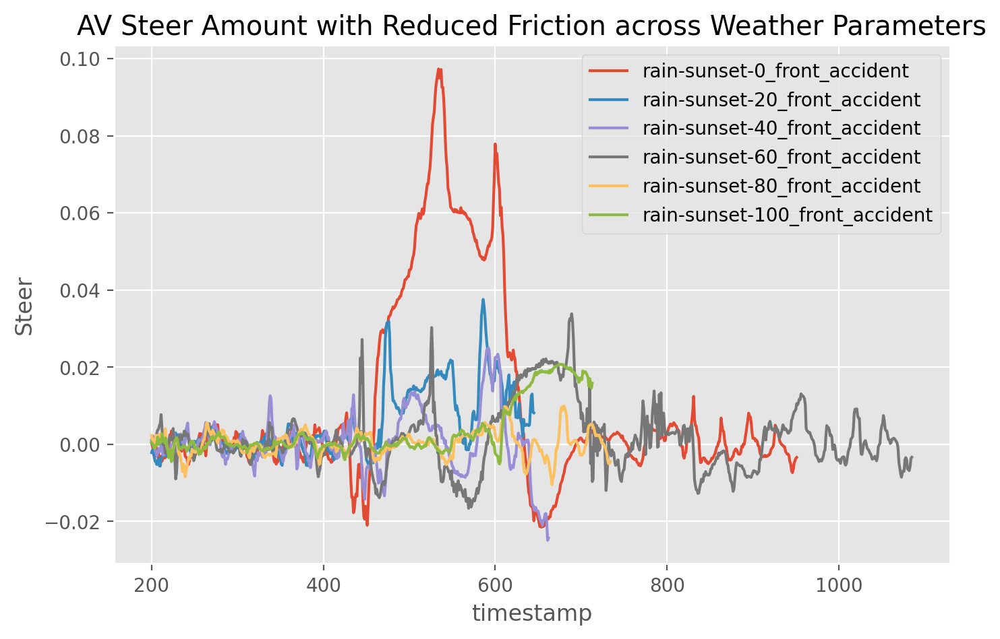

In [46]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_steer = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['steer'].isnull().values.any() :
                df_fric_steer["Run"+str(i)] = df_array_fric[weather][i]['steer']

    median_fric_steer = df_fric_steer.median(axis=1)

    plt.plot(median_fric_steer[200:])

    # plt.axis('equal')
plt.xlabel("timestamp")
plt.ylabel("Steer")
plt.title("AV Steer Amount with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### brake

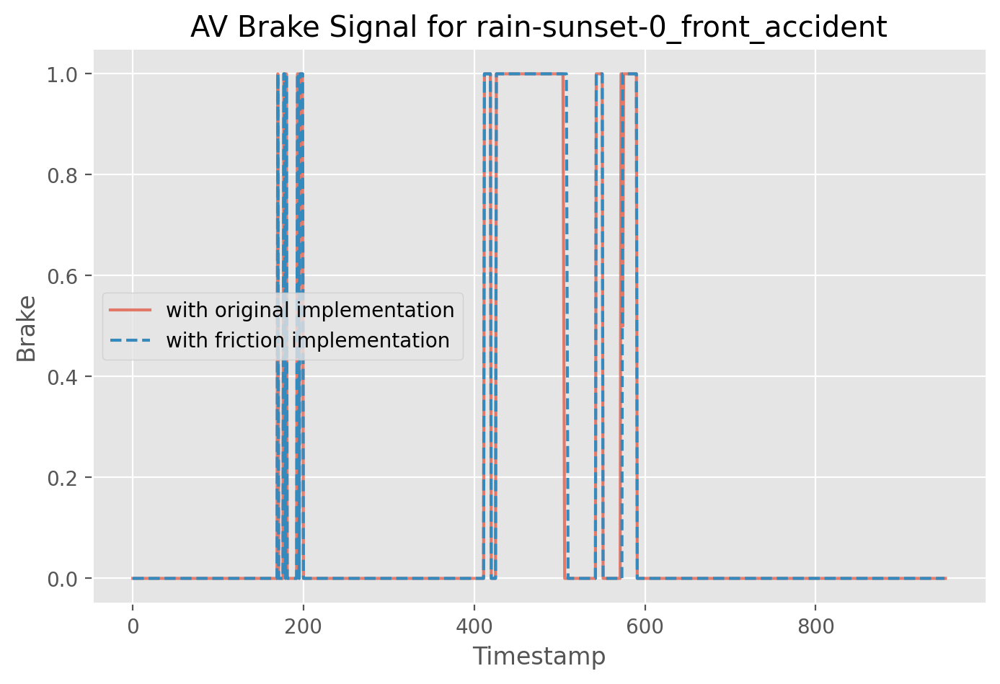

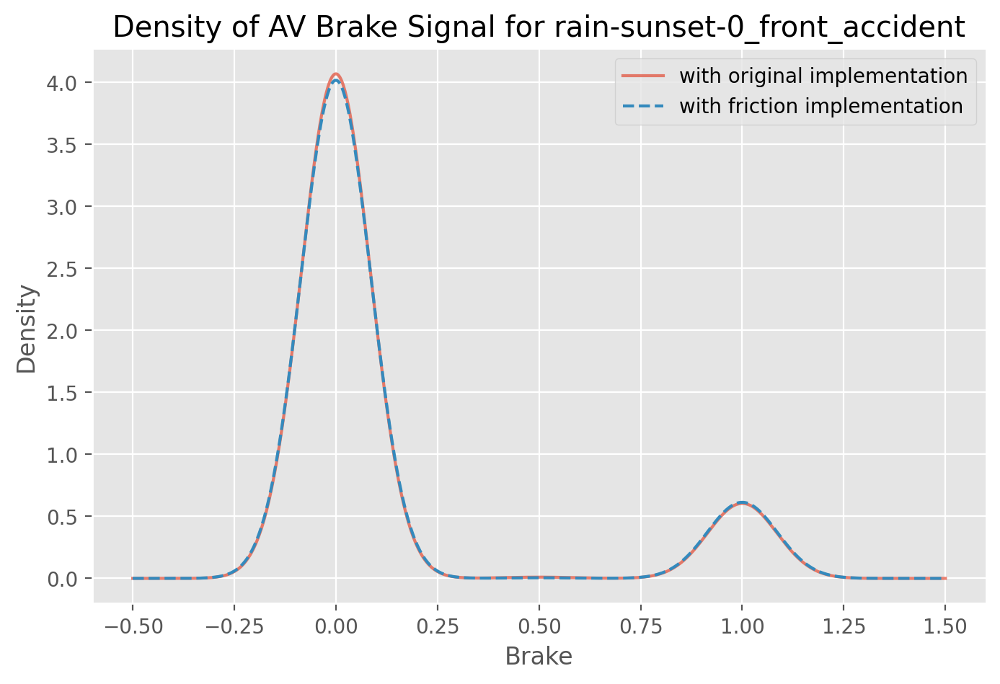

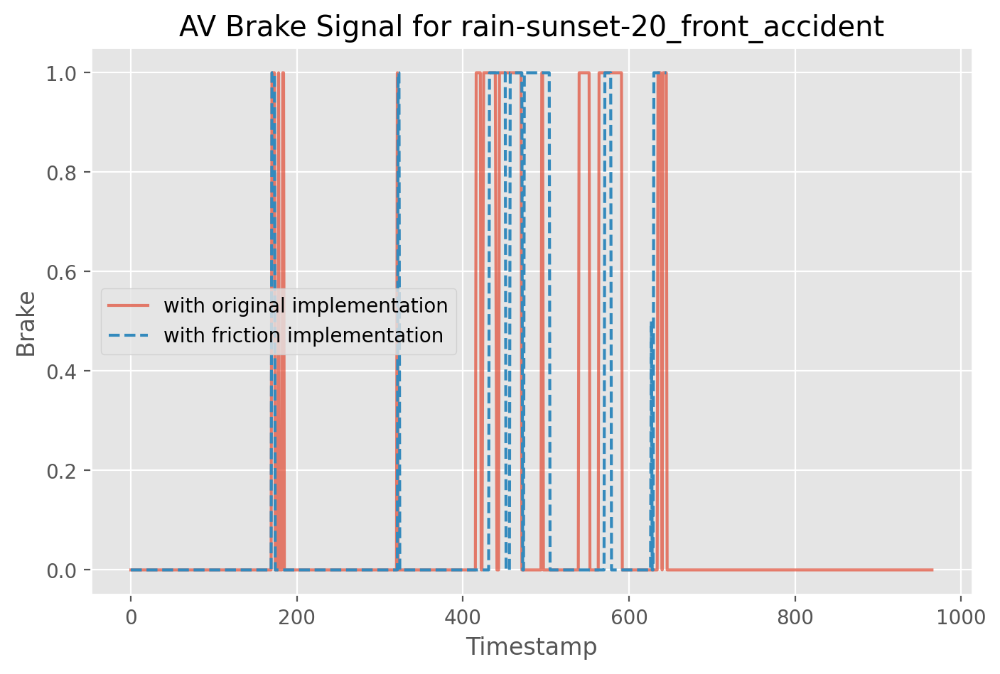

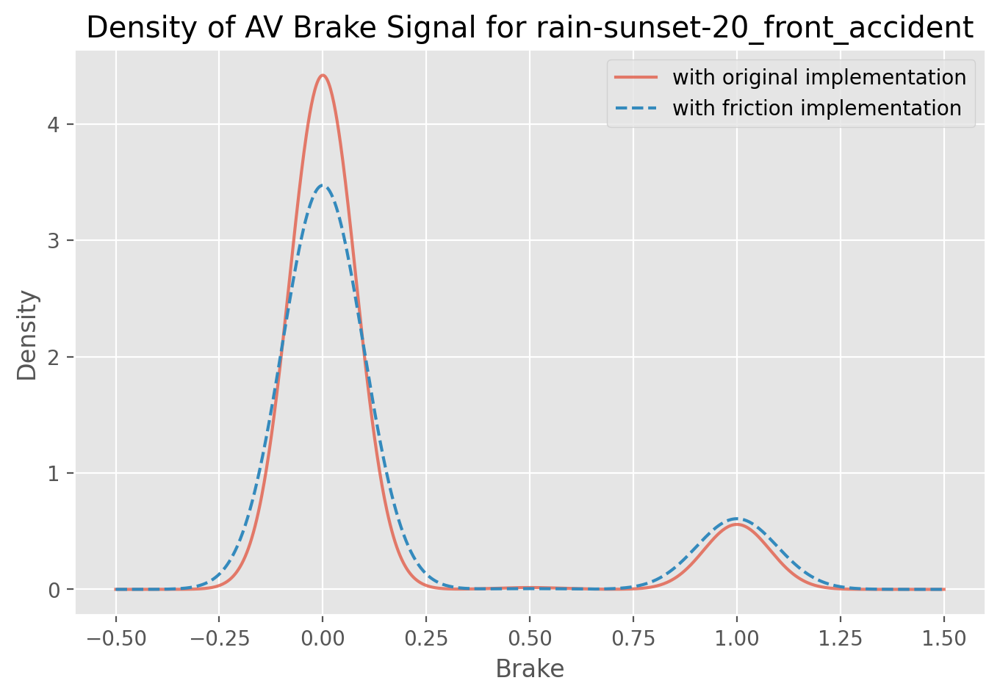

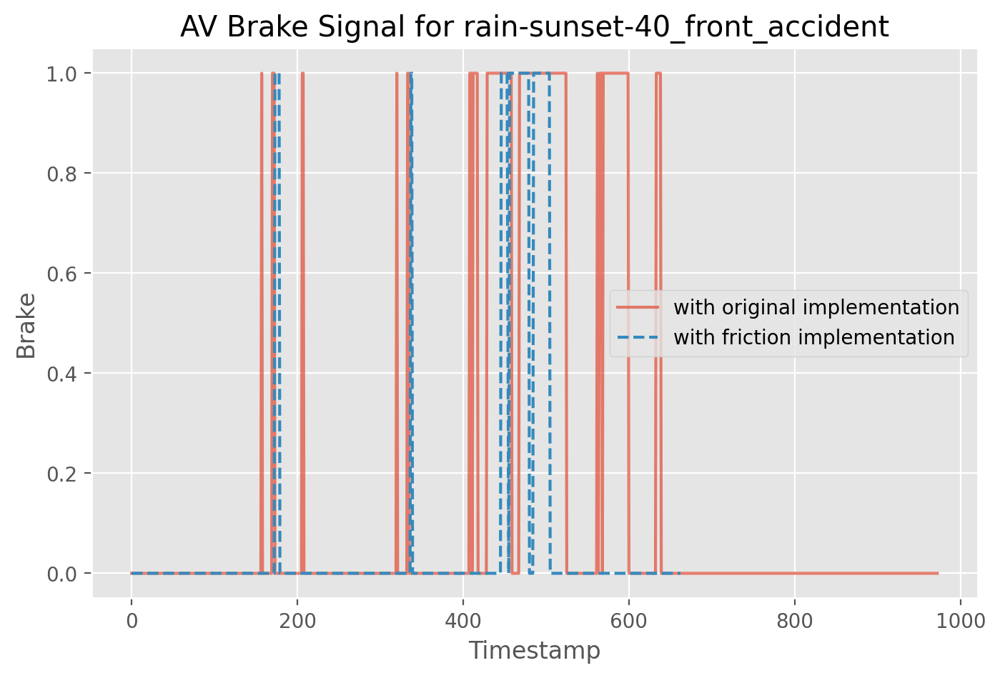

...

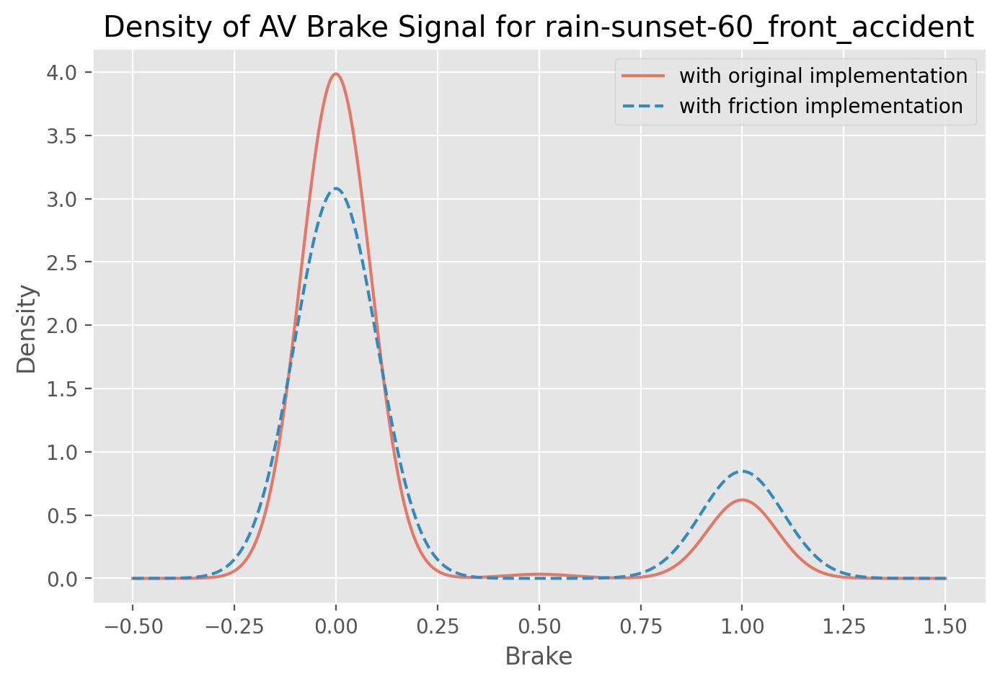

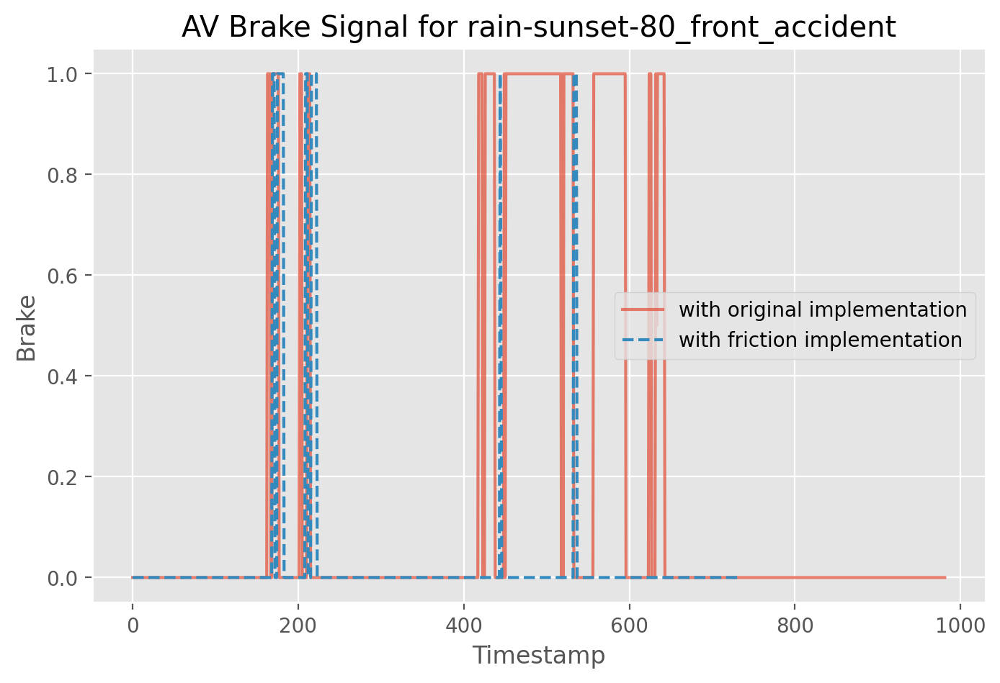

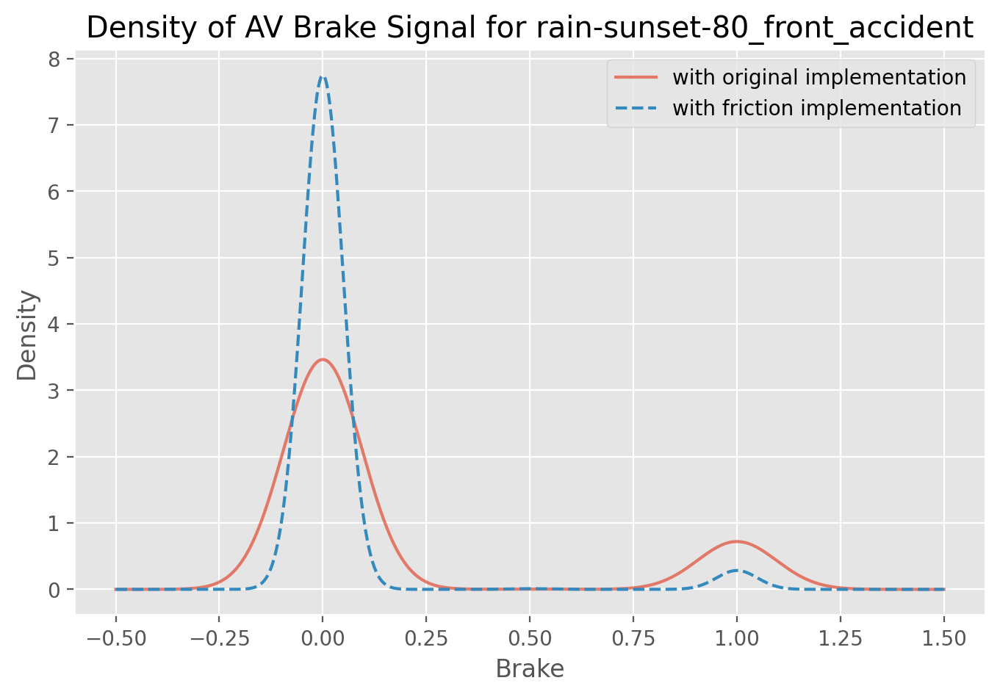

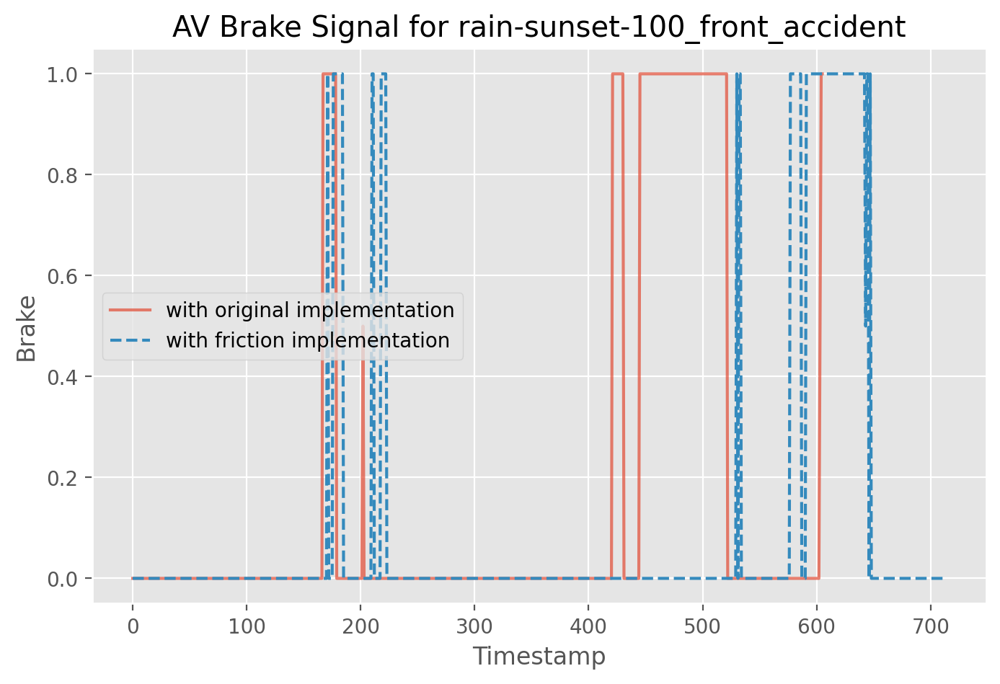

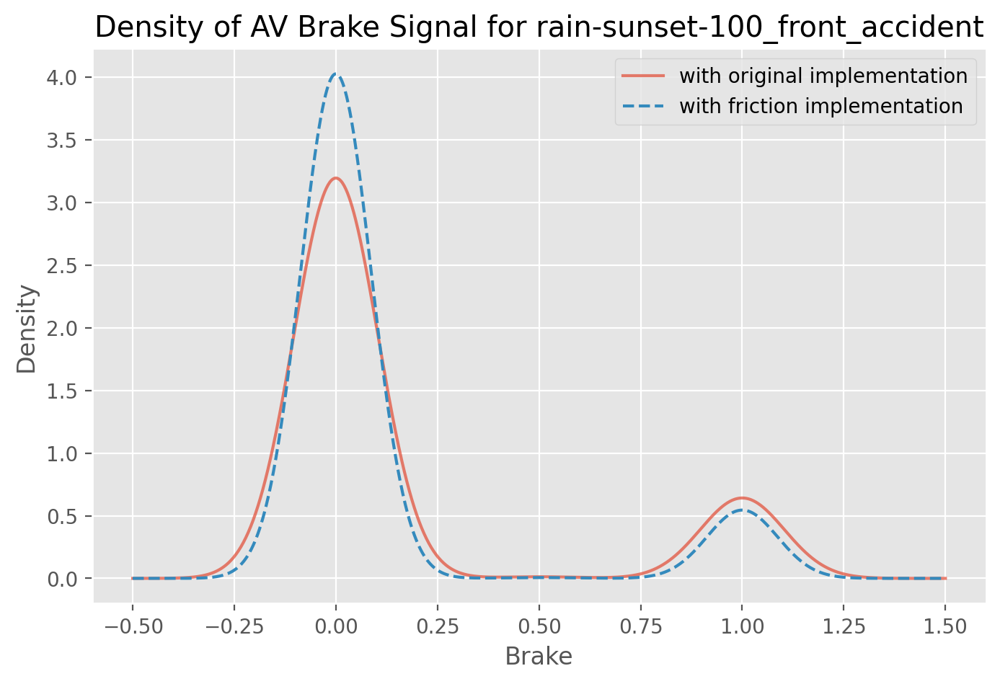

In [47]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_brake = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['brake'].isnull().values.any():
                df_orig_brake["Run"+str(i)] = df_array_orig[weather][i]['brake']

    median_orig_brake = df_orig_brake.median(axis=1)

    plt.plot(median_orig_brake, alpha=0.7)


    df_fric_brake = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['brake'].isnull().values.any():
                df_fric_brake["Run"+str(i)] = df_array_fric[weather][i]['brake']

    median_fric_brake = df_fric_brake.median(axis=1)
    
    all_medians[weather][5][0] = median_orig_brake
    all_medians[weather][5][1] = median_fric_brake
    
    plt.plot(median_fric_brake, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Brake")
    plt.title("AV Brake Signal for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Brake")
    plt.ylabel("Density")
    median_orig_brake.plot.density(alpha=0.7)
    median_fric_brake.plot.density(style='--')
    plt.title("Density of AV Brake Signal for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()


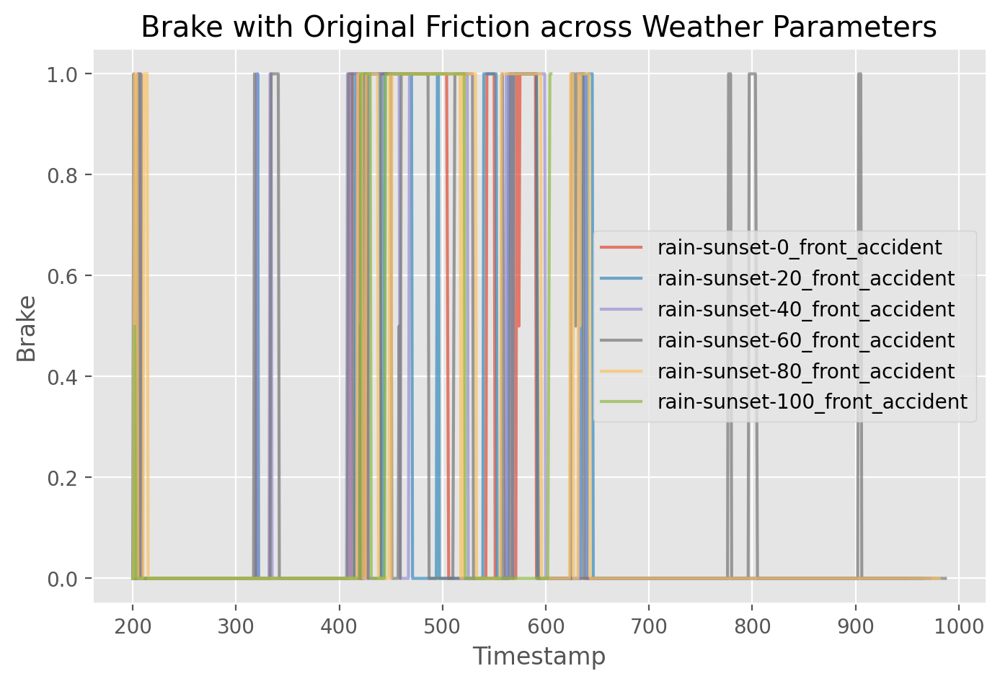

In [48]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_brake = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['brake'].dtypes == 'brake'):
            print(i)
        else:
            if not df_array_orig[weather][i]['brake'].isnull().values.any():
                df_orig_brake["Run"+str(i)] = df_array_orig[weather][i]['brake']

    median_orig_brake = df_orig_brake.median(axis=1)


    plt.plot(median_orig_brake[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Brake")
plt.title("Brake with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

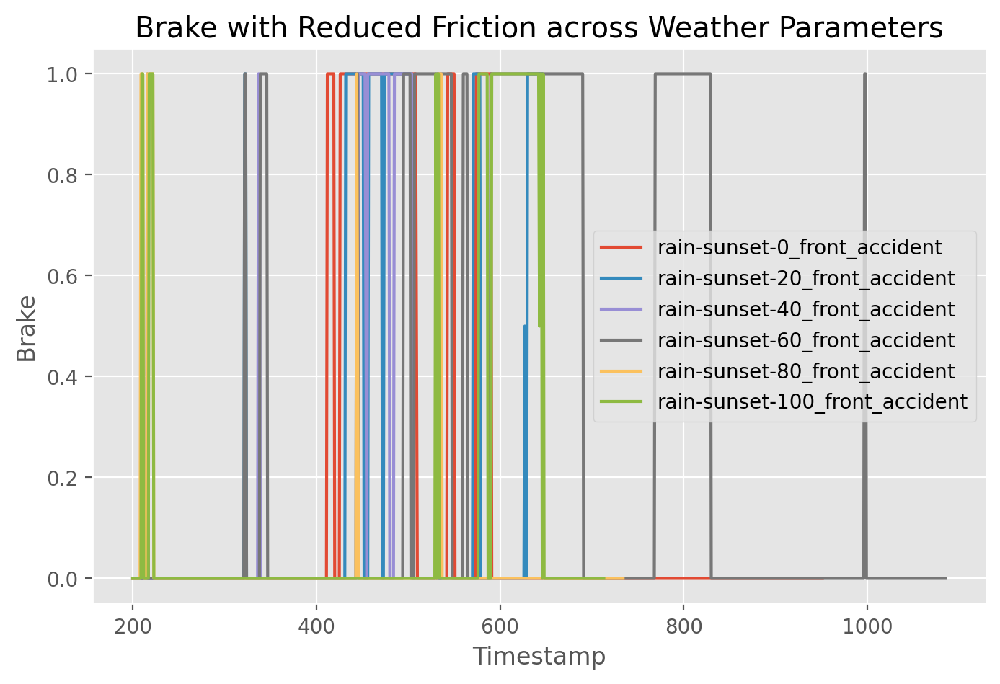

In [49]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_brake = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['brake'].isnull().values.any() :
                df_fric_brake["Run"+str(i)] = df_array_fric[weather][i]['brake']

    median_fric_brake = df_fric_brake.median(axis=1)

    plt.plot(median_fric_brake[200:])

plt.xlabel("Timestamp")
plt.ylabel("Brake")
plt.title("Brake with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

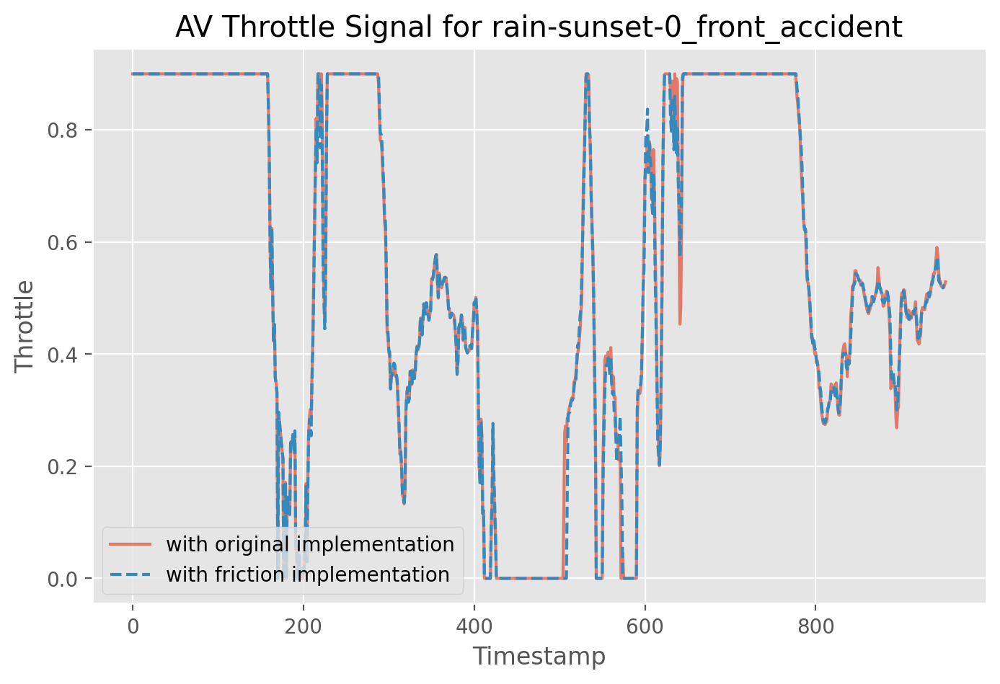

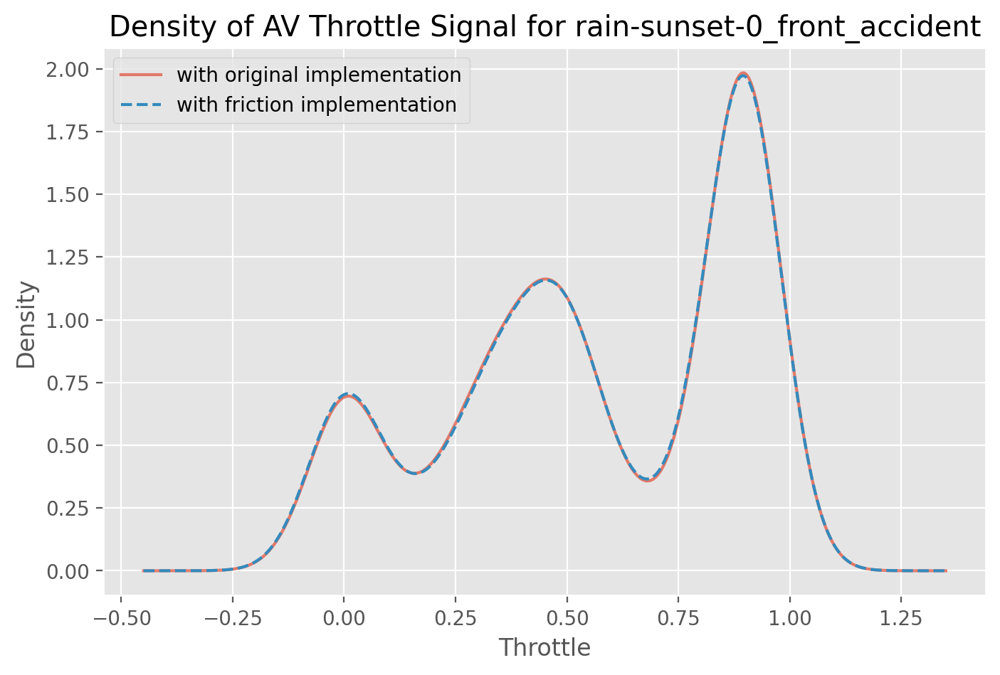

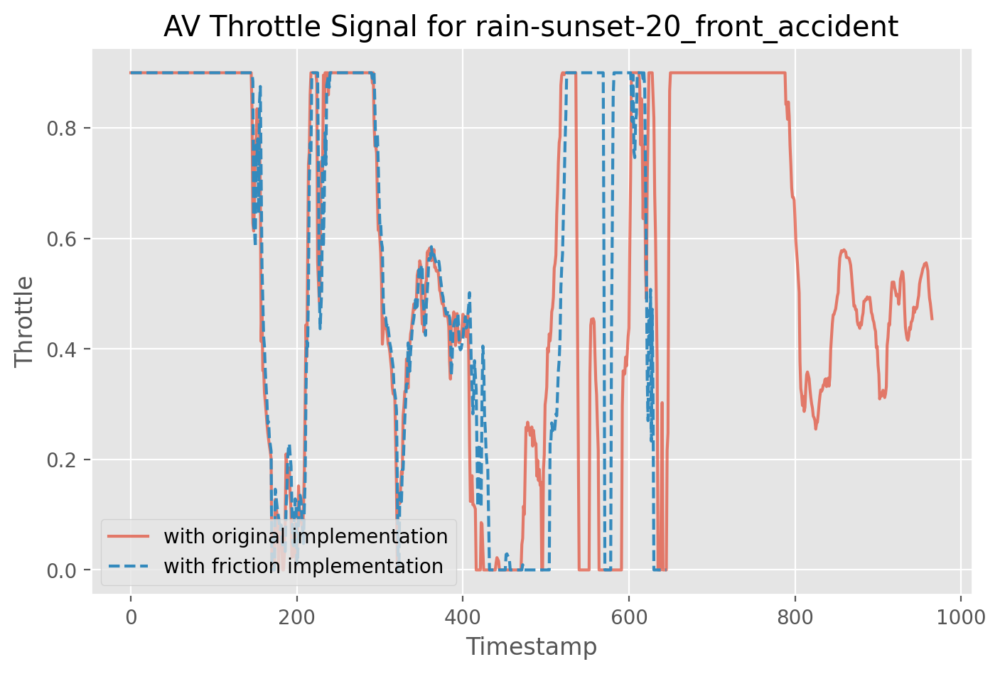

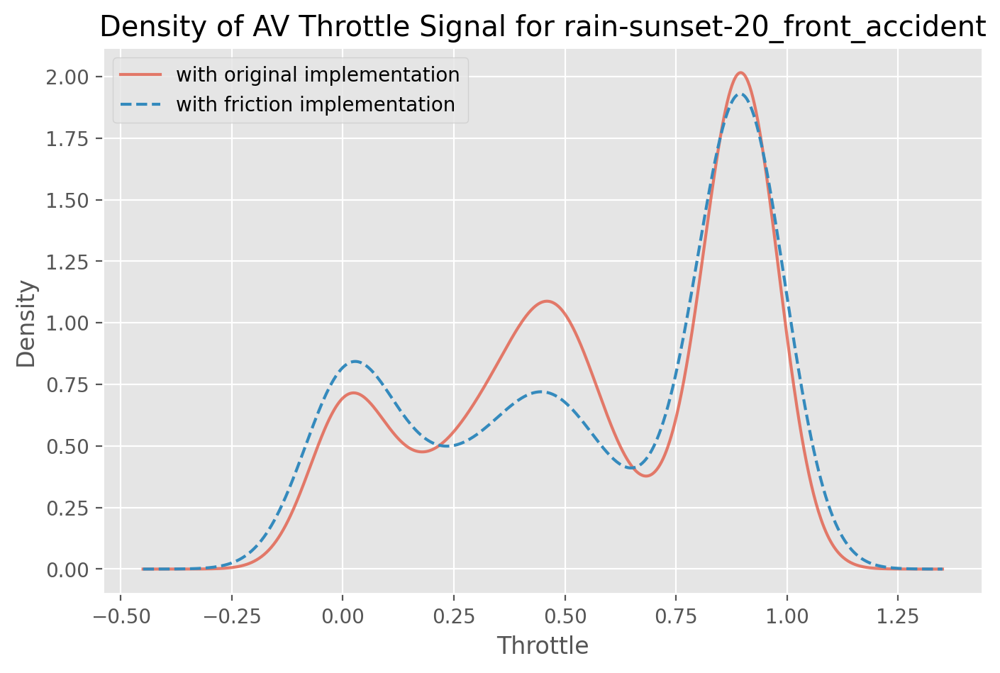

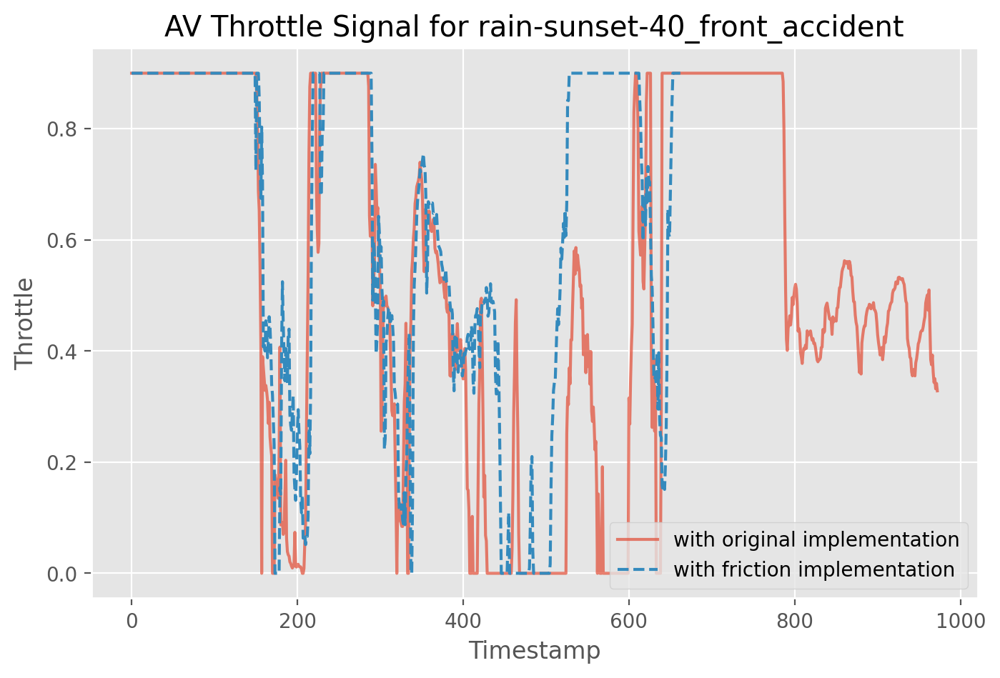

...

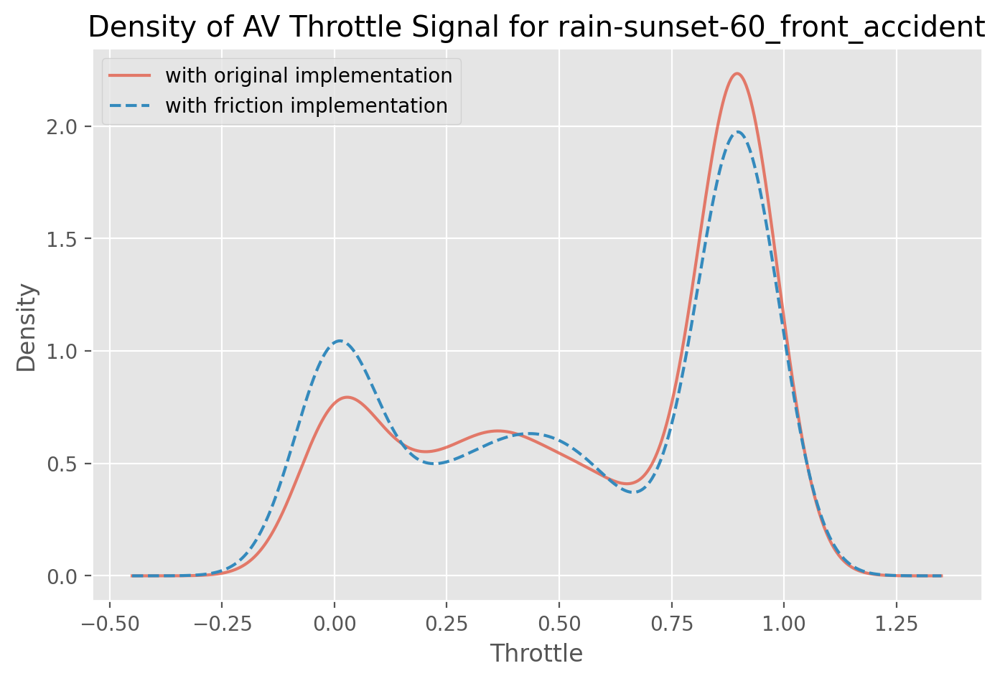

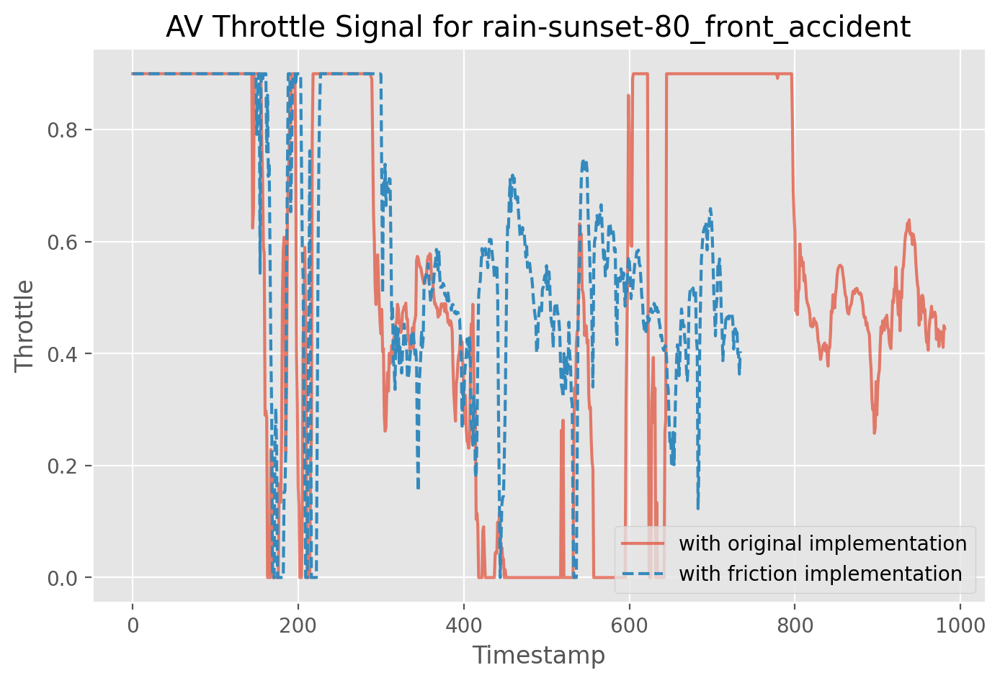

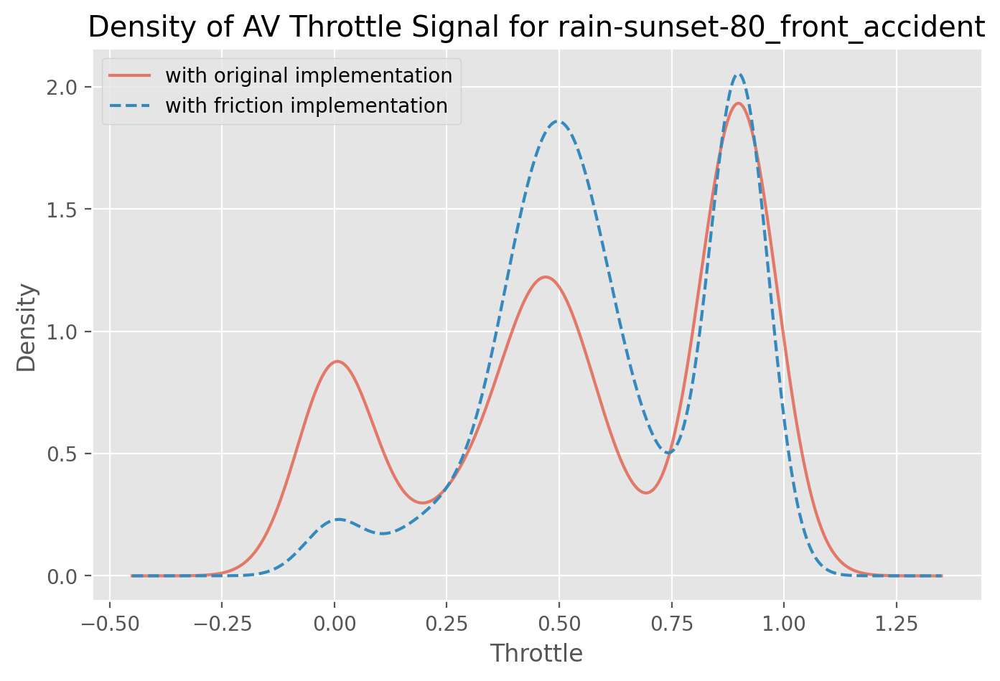

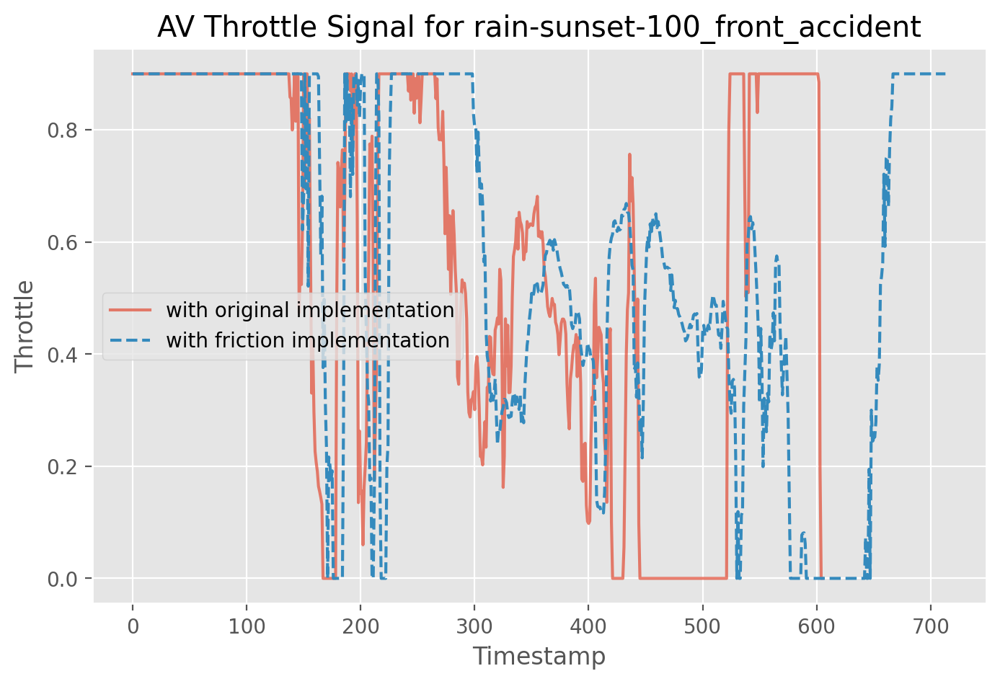

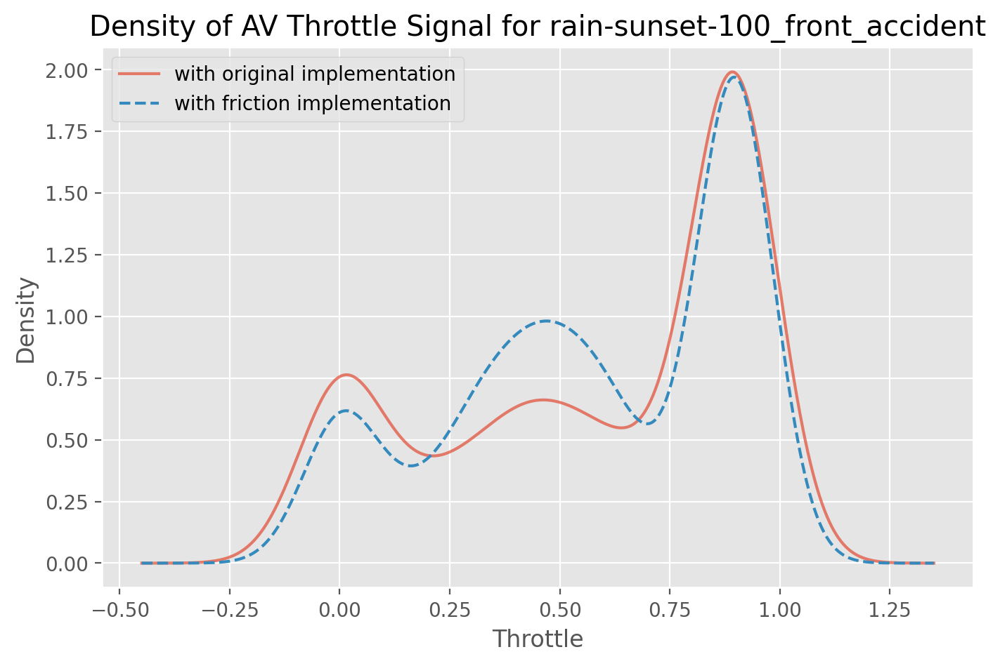

In [50]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_throttle = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['throttle'].isnull().values.any():
                df_orig_throttle["Run"+str(i)] = df_array_orig[weather][i]['throttle']

    median_orig_throttle = df_orig_throttle.median(axis=1)

    plt.plot(median_orig_throttle, alpha=0.7)


    df_fric_throttle = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['throttle'].isnull().values.any():
                df_fric_throttle["Run"+str(i)] = df_array_fric[weather][i]['throttle']

    median_fric_throttle = df_fric_throttle.median(axis=1)
    
    all_medians[weather][6][0] = median_orig_throttle
    all_medians[weather][6][1] = median_fric_throttle
    
    plt.plot(median_fric_throttle, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Throttle")
    plt.title("AV Throttle Signal for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Throttle")
    plt.ylabel("Density")
    median_orig_throttle.plot.density(alpha=0.7)
    median_fric_throttle.plot.density(style='--')
    plt.title("Density of AV Throttle Signal for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

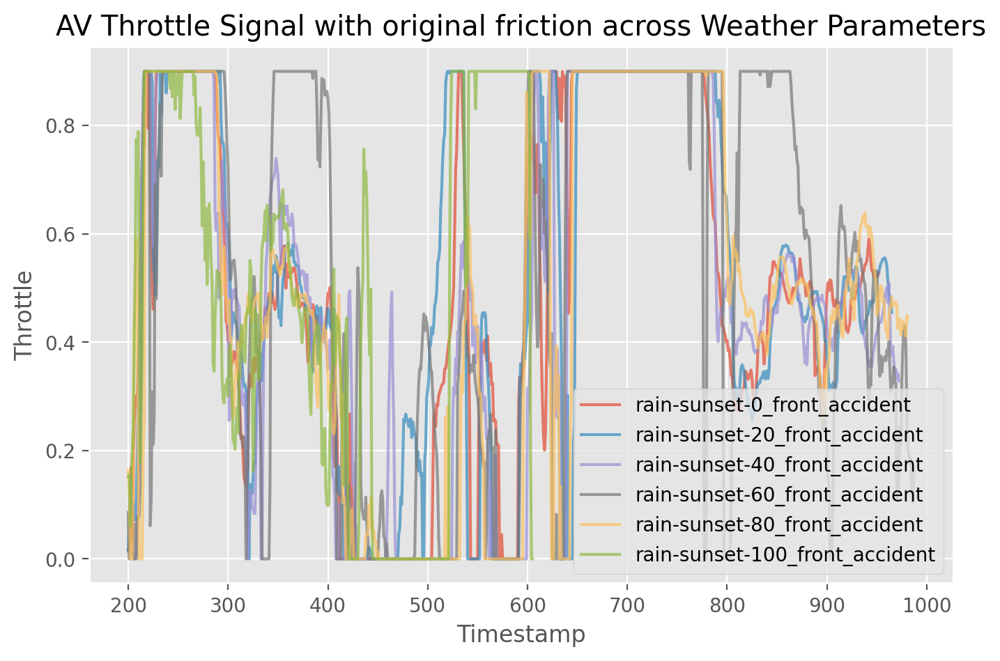

In [51]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_throttle = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['throttle'].dtypes == 'throttle'):
            print(i)
        else:
            if not df_array_orig[weather][i]['throttle'].isnull().values.any():
                df_orig_throttle["Run"+str(i)] = df_array_orig[weather][i]['throttle']

    median_orig_throttle = df_orig_throttle.median(axis=1)


    plt.plot(median_orig_throttle[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Throttle")
plt.title("AV Throttle Signal with original friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

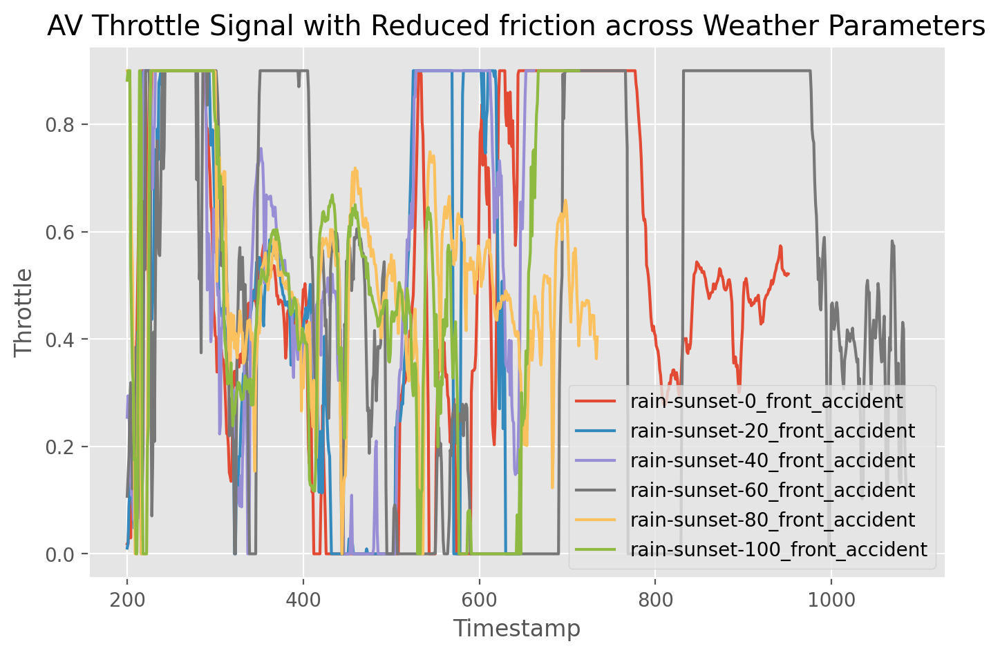

In [52]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_fric_throttle = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['throttle'].isnull().values.any() :
                df_fric_throttle["Run"+str(i)] = df_array_fric[weather][i]['throttle']

    median_fric_throttle = df_fric_throttle.median(axis=1)

    plt.plot(median_fric_throttle[200:])

    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("Throttle")
plt.title("AV Throttle Signal with Reduced friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

## Dynamic time warping (DTW) for cvip
### measuring similarity between two temporal sequences

In [53]:
all_dtw = [[0] * len(attribute_order)  for i in range(len(txt_lists_fric))]

for i in range(len(txt_lists_fric)):
    for j in range(len(attribute_order)):
        all_dtw[i][j] = dtw.distance(all_medians[i][j][0], all_medians[i][j][1])

In [54]:
for i in range(len(txt_lists_fric)):
    for j in range(len(attribute_order)):
        all_dtw[i][j] = round(all_dtw[i][j],2)

In [55]:
df = pd.DataFrame(all_dtw, columns = attribute_order, dtype = float)
df.index = subfolders
df.to_csv("DTW_front_accident_rainy.csv")
df

,x,y,v,cvip,steer,brake,throttle
rain-sunset-0_front_accident,0.03,0.84,0.39,0.66,0.02,0.50,0.35
rain-sunset-20_front_accident,4.50,455.82,85.38,444.55,0.33,5.00,2.92
rain-sunset-40_front_accident,1.80,355.26,45.66,448.48,0.18,3.54,3.11
rain-sunset-60_front_accident,0.17,2.10,16.81,237.21,0.09,3.57,3.16
rain-sunset-80_front_accident,0.03,1.90,83.15,130.84,0.09,3.81,3.25
rain-sunset-100_front_accident,4.29,337.84,5.09,47.96,0.05,3.28,2.21


## KS Test for cvip

In [56]:
import scipy as sp

In [57]:
all_ks = np.empty((len(txt_lists_fric), len(attribute_order), 2))
# [[0] * len(attribute_order)  for i in range(len(txt_lists_fric)-1)]
for i in range(len(txt_lists_fric)-1):
    for j in range(len(attribute_order)):
        ks_test = sp.stats.ks_2samp(all_medians[i][j][0], all_medians[i][j][1])
        all_ks[i][j][0] = ks_test.pvalue
        all_ks[i][j][1] = ks_test.statistic

In [58]:
df = pd.DataFrame(all_ks[:,:,0], columns = attribute_order, dtype = float)
df.index = subfolders
df

,x,y,v,cvip,steer,brake,throttle
rain-sunset-0_front_accident,4.834371e-03,1.297901e-01,1.000000e+00,9.888150e-01,9.999226e-01,1.000000e+00,1.000000e+00
rain-sunset-20_front_accident,5.842117e-69,1.770525e-21,1.172585e-06,1.069116e-12,3.053239e-08,6.526361e-01,1.314467e-01
rain-sunset-40_front_accident,1.999817e-21,3.789978e-16,1.615003e-07,1.433196e-13,8.534179e-07,1.158674e-01,1.110022e-07
rain-sunset-60_front_accident,9.723860e-41,3.481420e-38,7.017938e-05,1.106353e-18,2.870417e-04,1.800933e-03,1.115230e-03
rain-sunset-80_front_accident,3.458726e-12,5.322632e-10,4.120592e-26,3.455893e-32,4.609899e-17,2.549459e-07,2.976320e-09
rain-sunset-100_front_accident,1.054333e-311,1.054333e-311,1.054333e-311,1.054333e-311,1.054332e-311,1.054332e-311,1.054332e-311


In [59]:
df = pd.DataFrame(all_ks[:,:,1], columns = attribute_order, dtype = float)
df.index = subfolders
df

,x,y,v,cvip,steer,brake,throttle
rain-sunset-0_front_accident,7.916619e-02,5.304787e-02,8.001049e-03,1.986209e-02,1.449315e-02,3.286834e-03,6.970469e-03
rain-sunset-20_front_accident,4.430642e-01,2.484472e-01,1.354121e-01,1.899634e-01,1.516611e-01,3.680557e-02,5.874020e-02
rain-sunset-40_front_accident,2.458646e-01,2.129487e-01,1.431563e-01,1.947918e-01,1.356629e-01,5.955365e-02,1.447948e-01
rain-sunset-60_front_accident,2.969017e-01,2.874643e-01,9.907658e-02,2.004962e-01,9.200274e-02,8.186637e-02,8.462881e-02
rain-sunset-80_front_accident,1.785361e-01,1.611164e-01,2.632501e-01,2.923064e-01,2.121895e-01,1.367236e-01,1.547030e-01
rain-sunset-100_front_accident,1.054332e-311,1.054332e-311,1.054333e-311,1.054333e-311,1.054333e-311,1.054333e-311,1.054333e-311
